In [508]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import pandas as pd
import geopandas as gpd
from shapely import wkt
from shapely.geometry import Point 
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patheffects as pe
import matplotlib.colors as mcolors
from scipy.stats import gaussian_kde

In [ ]:
#first view at the dataset. get an idea of the data and what we are working with

In [509]:
df_coles = pd.read_csv('/Users/34633/avdata/truco-o-dato/data/data_aprobados_colegio_barrio_2022.csv', sep=';', encoding = 'latin1')
col_name = df_coles.columns[8]
print(df_coles[col_name])
df_coles_bcn = df_coles[df_coles["Municipi"]=="BARCELONA"].copy()

df_coles_bcn.head()

0        801901
1        801901
2        801901
3        801901
4        801901
          ...  
11674    813800
11675    813800
11676    813800
11677    813800
11678    813800
Name: Codi districte, Length: 11679, dtype: int64


,Curs,Estudi,Codi àrea territorial,Àrea territorial,Codi comarca,Comarca,Codi municipi,Municipi,Codi districte,Naturalesa,Titularitat,Nivell,Sexe,Concert,Resultat de l'avaluació,Alumnes avaluats
0,2021/2022,EDUCACIÓ SECUNDÀRIA OBLIGATÒRIA,108,CONSORCI D'EDUCACIÓ DE BARCELONA,13,BARCELONÈS,8019,BARCELONA,801901,PRIVAT,FUNDACIONS,1,DONA,SI,PROMOCIONEN SENSE PENDENTS,17
1,2021/2022,EDUCACIÓ SECUNDÀRIA OBLIGATÒRIA,108,CONSORCI D'EDUCACIÓ DE BARCELONA,13,BARCELONÈS,8019,BARCELONA,801901,PRIVAT,FUNDACIONS,1,HOME,SI,PROMOCIONEN AMB PENDENTS,5
2,2021/2022,EDUCACIÓ SECUNDÀRIA OBLIGATÒRIA,108,CONSORCI D'EDUCACIÓ DE BARCELONA,13,BARCELONÈS,8019,BARCELONA,801901,PRIVAT,FUNDACIONS,1,HOME,SI,PROMOCIONEN SENSE PENDENTS,38
3,2021/2022,EDUCACIÓ SECUNDÀRIA OBLIGATÒRIA,108,CONSORCI D'EDUCACIÓ DE BARCELONA,13,BARCELONÈS,8019,BARCELONA,801901,PRIVAT,FUNDACIONS,2,DONA,SI,NO PROMOCIONEN,1
4,2021/2022,EDUCACIÓ SECUNDÀRIA OBLIGATÒRIA,108,CONSORCI D'EDUCACIÓ DE BARCELONA,13,BARCELONÈS,8019,BARCELONA,801901,PRIVAT,FUNDACIONS,2,DONA,SI,PROMOCIONEN AMB PENDENTS,6


In [ ]:
#introduce the name of each district from its district code

In [512]:
district_map = {
    "01": "Ciutat Vella", "02": "Eixample", "03": "Sants-Montjuïc",
    "04": "Les Corts", "05": "Sarrià-Sant Gervasi", "06": "Gràcia",
    "07": "Horta-Guinardó", "08": "Nou Barris", "09": "Sant Andreu", "10": "Sant Martí",
}

def map_district(code):
    try:
        code_str = str(code)
        if code_str.isdigit() and len(code_str) >= 2:
            district_num = code_str[-2:] if len(code_str) > 2 else code_str
            return district_map.get(district_num, "Unknown")
        else:
            return "Unknown"
    except:
        return "Unknown"
        
df_coles_bcn['District_Name'] = df_coles_bcn['Codi districte'].apply(map_district)
print(df_coles_bcn[['Codi districte', 'District_Name']].head())
df_coles_bcn.head()

   Codi districte District_Name
0          801901  Ciutat Vella
1          801901  Ciutat Vella
2          801901  Ciutat Vella
3          801901  Ciutat Vella
4          801901  Ciutat Vella


,Curs,Estudi,Codi àrea territorial,Àrea territorial,Codi comarca,Comarca,Codi municipi,Municipi,Codi districte,Naturalesa,Titularitat,Nivell,Sexe,Concert,Resultat de l'avaluació,Alumnes avaluats,District_Name
0,2021/2022,EDUCACIÓ SECUNDÀRIA OBLIGATÒRIA,108,CONSORCI D'EDUCACIÓ DE BARCELONA,13,BARCELONÈS,8019,BARCELONA,801901,PRIVAT,FUNDACIONS,1,DONA,SI,PROMOCIONEN SENSE PENDENTS,17,Ciutat Vella
1,2021/2022,EDUCACIÓ SECUNDÀRIA OBLIGATÒRIA,108,CONSORCI D'EDUCACIÓ DE BARCELONA,13,BARCELONÈS,8019,BARCELONA,801901,PRIVAT,FUNDACIONS,1,HOME,SI,PROMOCIONEN AMB PENDENTS,5,Ciutat Vella
2,2021/2022,EDUCACIÓ SECUNDÀRIA OBLIGATÒRIA,108,CONSORCI D'EDUCACIÓ DE BARCELONA,13,BARCELONÈS,8019,BARCELONA,801901,PRIVAT,FUNDACIONS,1,HOME,SI,PROMOCIONEN SENSE PENDENTS,38,Ciutat Vella
3,2021/2022,EDUCACIÓ SECUNDÀRIA OBLIGATÒRIA,108,CONSORCI D'EDUCACIÓ DE BARCELONA,13,BARCELONÈS,8019,BARCELONA,801901,PRIVAT,FUNDACIONS,2,DONA,SI,NO PROMOCIONEN,1,Ciutat Vella
4,2021/2022,EDUCACIÓ SECUNDÀRIA OBLIGATÒRIA,108,CONSORCI D'EDUCACIÓ DE BARCELONA,13,BARCELONÈS,8019,BARCELONA,801901,PRIVAT,FUNDACIONS,2,DONA,SI,PROMOCIONEN AMB PENDENTS,6,Ciutat Vella


In [ ]:
#test of the colorblind palette

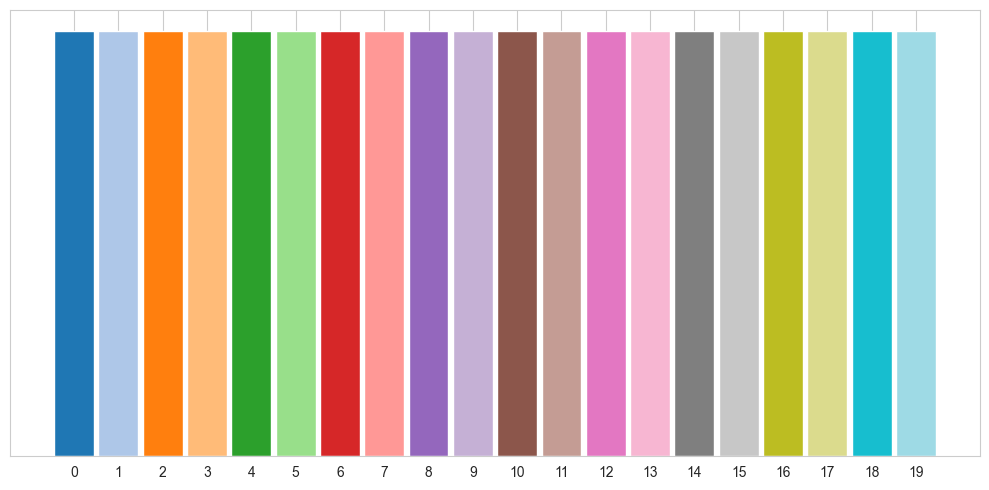

In [611]:
indices = np.arange(20)
tab20_cmap = plt.colormaps['tab20']
fig, ax = plt.subplots(figsize=(10, 5))
barras = ax.bar(indices, 1, color=[tab20_cmap(i) for i in indices], width=0.9)

ax.set_xticks(indices)
ax.set_xticklabels([str(i) for i in indices], rotation=0)
ax.set_yticks([])
plt.tight_layout()
plt.show()

In [513]:
#DATAFRAME NEET NOMES AMB LA INFO IMPORTANT
df = df_coles_bcn[(df_coles_bcn['Nivell'] == 4)][['Municipi', 'District_Name', 'Naturalesa','Titularitat', 
                                                  'Alumnes avaluats', 'Sexe', 'Concert', "Resultat de l'avaluació"]].copy()
print(f"Number of rows in filtered DataFrame: {len(df)}")
df.head()
df.columns.tolist()

Number of rows in filtered DataFrame: 281


['Municipi',
 'District_Name',
 'Naturalesa',
 'Titularitat',
 'Alumnes avaluats',
 'Sexe',
 'Concert',
 "Resultat de l'avaluació"]

In [ ]:
#bar plot (marimekko plot in the following cell) of the results of the students by district

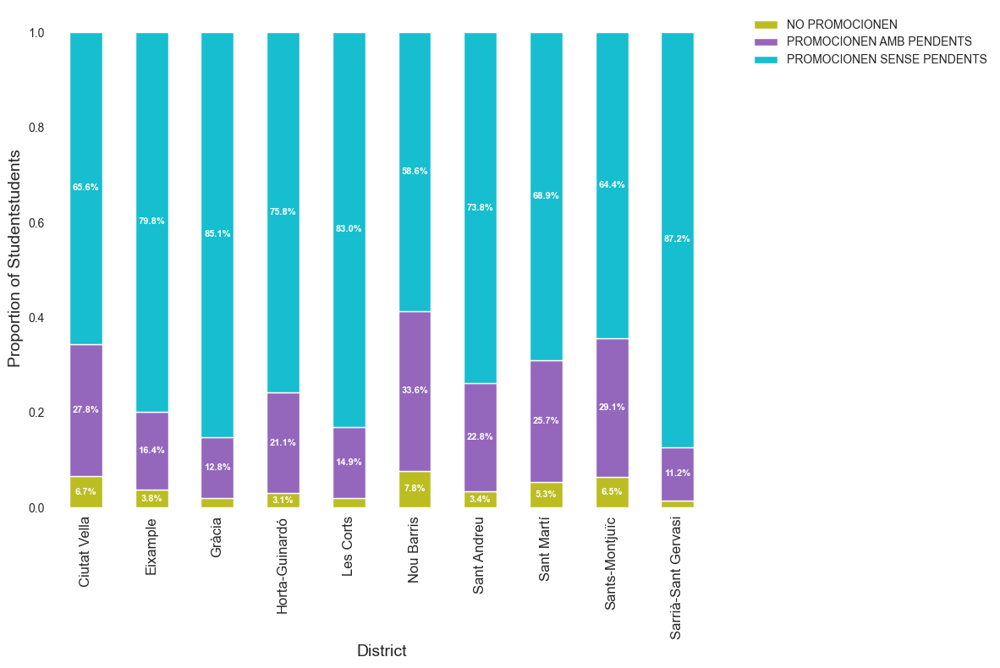

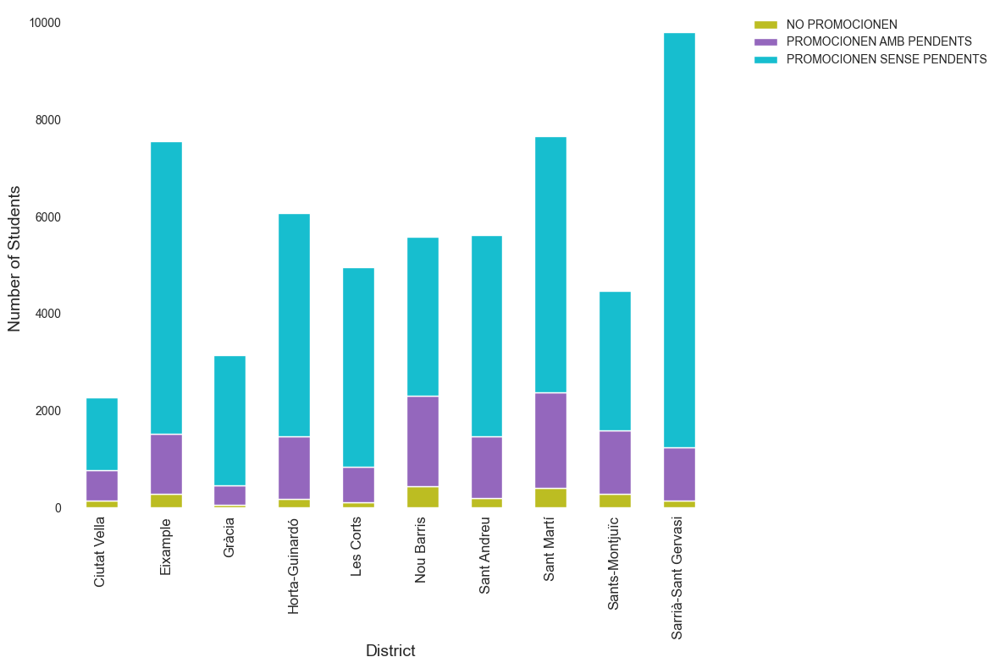

In [515]:
try:
    TAB20_CMAP = plt.colormaps['tab20']
except KeyError:
    TAB20_CMAP = plt.cm.get_cmap('tab20')

CUSTOM_COLORS = [TAB20_CMAP(16), TAB20_CMAP(8), TAB20_CMAP(18)]
new_cmap = mcolors.ListedColormap(CUSTOM_COLORS)

RESULT_ORDER = ['NO PROMOCIONEN', 'PROMOCIONEN AMB PENDENTS', 'PROMOCIONEN SENSE PENDENTS']
df_counts = df_coles_bcn.groupby(["District_Name", "Resultat de l'avaluació"])["Alumnes avaluats"].sum().unstack(fill_value=0)

df_counts['TOTAL'] = df_counts.sum(axis=1)
df_norm = df_counts.drop(columns=['TOTAL']).div(df_counts['TOTAL'], axis=0)

existing_results = [col for col in RESULT_ORDER if col in df_norm.columns]
df_norm = df_norm[existing_results]
df_counts_plot = df_counts.drop(columns=['TOTAL'], errors='ignore')
df_counts_plot = df_counts_plot[existing_results]

fig1, ax1 = plt.subplots(figsize=(12,8))
df_norm.plot(kind='bar', stacked=True, cmap=new_cmap, ax=ax1)
for spine in ax1.spines.values():
    spine.set_visible(False)
ax1.legend( title=None,  bbox_to_anchor=(1.05, 1), loc='upper left',frameon=False, fontsize=10)
ax1.set_xlabel("District", fontsize=14)
ax1.set_ylabel("Proportion of Studentstudents", fontsize=14)
ax1.tick_params(axis='x', rotation=90, labelsize=12)

for i, district in enumerate(df_norm.index):
    cumulative = 0
    for result in df_norm.columns:
        value = df_norm.loc[district, result]
        if value > 0.03:
            ax1.text(i, cumulative + value/2, f'{value:.1%}', 
                    ha='center', va='center', color='white', fontweight='bold', fontsize=8)
        cumulative += value
plt.tight_layout()
plt.savefig('data_Anna/counts_proportion.png', dpi = 500)
plt.grid(False)
plt.show()

fig2, ax2 = plt.subplots(figsize=(12,8))
df_counts_plot.plot(kind='bar', stacked=True, cmap=new_cmap, ax=ax2)
ax2.set_xlabel("District", fontsize=14)
ax2.set_ylabel("Number of Students", fontsize=14)
ax2.tick_params(axis='x', rotation=90, labelsize=12)
plt.grid(False)
ax2.legend( title=None,  bbox_to_anchor=(1.05, 1),  loc='upper left', frameon=False,fontsize=10)
plt.tight_layout()
for spine in ax2.spines.values():
    spine.set_visible(False)
plt.savefig('data_Anna/counts_number.png', dpi=500)
plt.show()

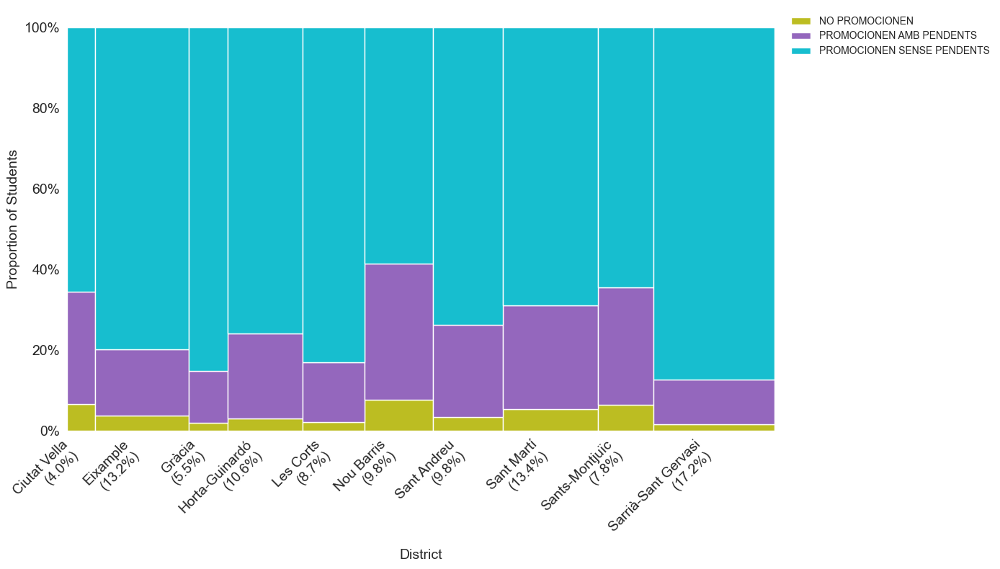

In [429]:
try:
    TAB20_CMAP = plt.colormaps['tab20']
except KeyError:
    TAB20_CMAP = plt.cm.get_cmap('tab20')

CUSTOM_COLORS = [TAB20_CMAP(16), TAB20_CMAP(8), TAB20_CMAP(18)]
new_cmap = mcolors.ListedColormap(CUSTOM_COLORS)

RESULT_ORDER = ['NO PROMOCIONEN', 'PROMOCIONEN AMB PENDENTS', 'PROMOCIONEN SENSE PENDENTS']
total_alumnes_global = df_counts['TOTAL'].sum()
district_width_prop = df_counts['TOTAL'] / total_alumnes_global
x_start_pos = district_width_prop.cumsum().shift(1, fill_value=0)

plot_data = pd.DataFrame({
    'start': x_start_pos,
    'width': district_width_prop,
    'District_Name': df_norm.index
}).set_index('District_Name')
fig, ax = plt.subplots(figsize=(14, 8))

for i, result in enumerate(df_norm.columns):
    if i == 0:
        height_start = 0
    else:
        height_start = df_norm.iloc[:, :i].sum(axis=1)
    ax.bar(x=plot_data['start'], height=df_norm[result], width=plot_data['width'],bottom=height_start,  align='edge', color=new_cmap.colors[i],       label=result )
x_ticks_center = plot_data['start'] + plot_data['width'] / 2
x_tick_labels = [ f"{district}\n({w:.1%})"  for district, w in zip(plot_data.index, plot_data['width'])]

ax.set_xticks(x_ticks_center)
ax.set_xticklabels(x_tick_labels, rotation=45, ha='right', fontsize=14)
ax.set_yticks(np.linspace(0, 1, 6)) 
ax.set_yticklabels([f'{int(p*100)}%' for p in np.linspace(0, 1, 6)], fontsize=14)
ax.set_ylabel("Proportion of Students", fontsize=14)
ax.set_xlabel("District", fontsize=14)
ax.set_xlim(0, 1)
ax.legend( title=None,  bbox_to_anchor=(1.01, 1),  loc='upper left',frameon=False,fontsize=10)
plt.grid(False)
for spine in ax.spines.values():
    spine.set_visible(False)
plt.tight_layout()
plt.show()

In [ ]:
#heatmap of the results of the students by districts in barcelona

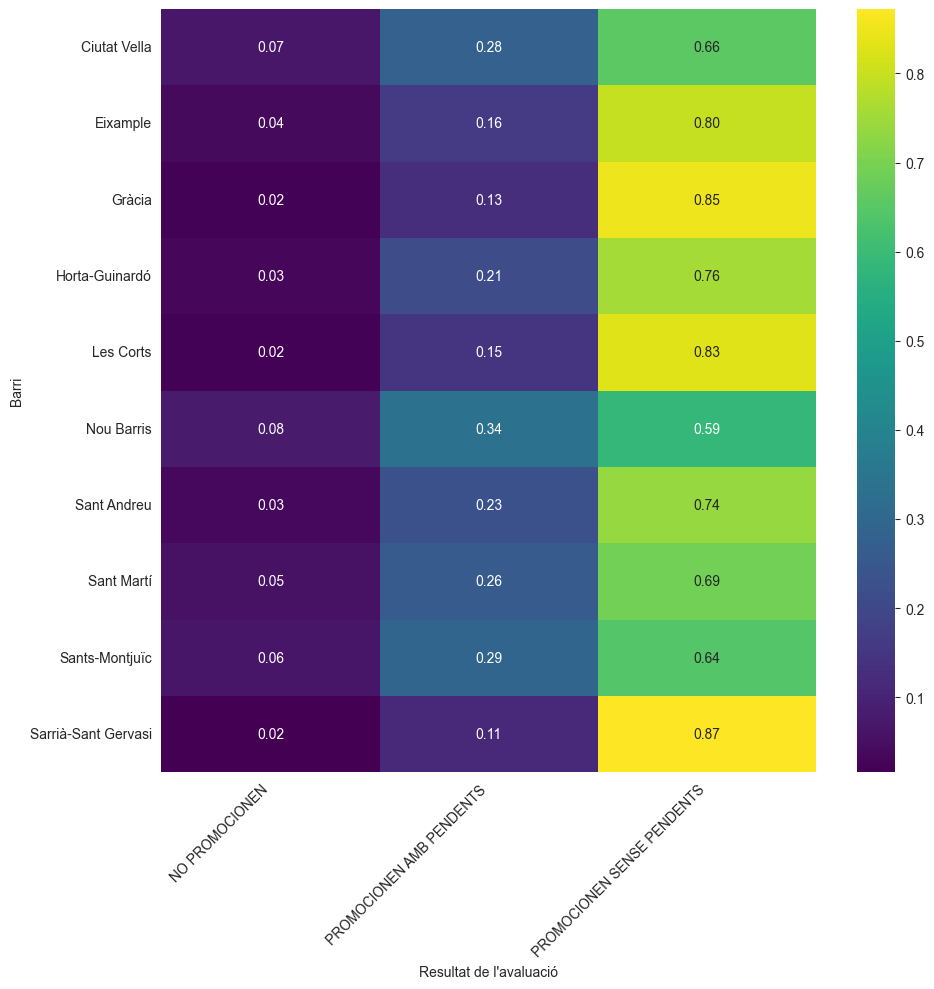

Resultat de l'avaluació,NO PROMOCIONEN,PROMOCIONEN AMB PENDENTS,PROMOCIONEN SENSE PENDENTS
District_Name,,,
Ciutat Vella,0.066667,0.277704,0.655629
Eixample,0.038105,0.164197,0.797698
Gràcia,0.020701,0.128025,0.851274
Horta-Guinardó,0.030906,0.211080,0.758014
Les Corts,0.020775,0.149455,0.829770


In [434]:
plt.figure(figsize=(10,10))
sns.heatmap(df_norm, cmap='viridis', annot=True, fmt=".2f")
#plt.xlabel("Resultat avaluació")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Barri")
plt.tight_layout()
plt.show()

df_norm.head()

In [ ]:
#result of students by type of school

281 rows

Total students by detailed school type (Level 4 only):
CONCERTAT: 8,263 students
PRIVAT: 254 students
PÚBLIC: 5,582 students

Percentage by detailed school type (Level 4 only):
CONCERTAT: 58.61%
PRIVAT: 1.80%
PÚBLIC: 39.59%

Percentage by school type:


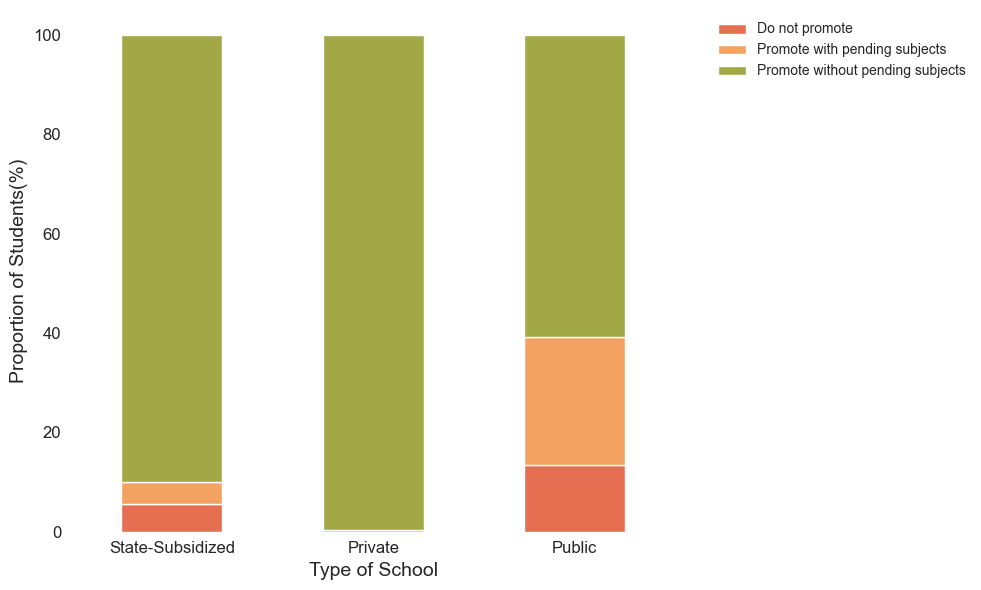

In [610]:
CUSTOM_COLORS = ['#E76F51', '#F4A261', '#A3A847']
colormap = mcolors.ListedColormap(CUSTOM_COLORS)
df['Naturalesa_Clean'] = df['Naturalesa'].astype(str).str.strip().str.upper()
df['Concert_Clean'] = df['Concert'].astype(str).str.strip().str.upper()

def classify_school_type(row):
    if row['Naturalesa_Clean'] == 'PÚBLIC':
        return 'PÚBLIC'
    elif row['Naturalesa_Clean'] == 'PRIVAT':
        if row['Concert_Clean'] == 'SI':
            return 'CONCERTAT'
        elif row['Concert_Clean'] == 'NO':
            return 'PRIVAT'
    return 'OTRO'
df['School_Type_Detailed'] = df.apply(classify_school_type, axis=1)
print(f"{df.shape[0]} rows")
students_by_type = df.groupby('School_Type_Detailed')['Alumnes avaluats'].sum()

for school_type, total in students_by_type.items():
    print(f"{school_type}: {total:,.0f} students")
total_students = students_by_type.sum()

for school_type, total in students_by_type.items():
    percentage = (total / total_students) * 100
    print(f"{school_type}: {percentage:.2f}%")
NEW_X_LABELS = {'PÚBLIC': 'Public','CONCERTAT': 'State-Subsidized','PRIVAT': 'Private'}
NEW_LEGEND_LABELS = {'PROMOCIONEN SENSE PENDENTS': 'Promote without pending subjects','PROMOCIONEN AMB PENDENTS': 'Promote with pending subjects','NO PROMOCIONEN': 'Do not promote'}


plot1_data = (df.groupby(['School_Type_Detailed', "Resultat de l'avaluació"])['Alumnes avaluats'].sum().unstack(fill_value=0))
fig, ax1 = plt.subplots(figsize=(10, 6))
plot1_data_pct.plot(kind='bar', stacked=True, ax=ax1, cmap=colormap)
ax1.set_xlabel("Type of School", fontsize=14)
ax1.set_ylabel("Proportion of Students(%)", fontsize=14)
current_labels = plot1_data_pct.index.tolist()
new_labels_in_order = [NEW_X_LABELS.get(label, label) for label in current_labels]
ax1.set_xticklabels(new_labels_in_order, rotation=0, fontsize=12)
ax1.tick_params(axis='x', rotation=0, labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
ax1.grid(False)

for spine in ax1.spines.values():
    spine.set_visible(False)
    
handles, labels = ax1.get_legend_handles_labels()
new_legend_labels_in_order = [NEW_LEGEND_LABELS.get(label, label) for label in labels]
ax1.legend(handles, new_legend_labels_in_order, title=None, bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, fontsize=10)
plt.tight_layout()
plt.show()


In [ ]:
#distribution of students by titularity of school

C:\Users\34633\AppData\Local\Temp\ipykernel_13928\3186942437.py:41: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



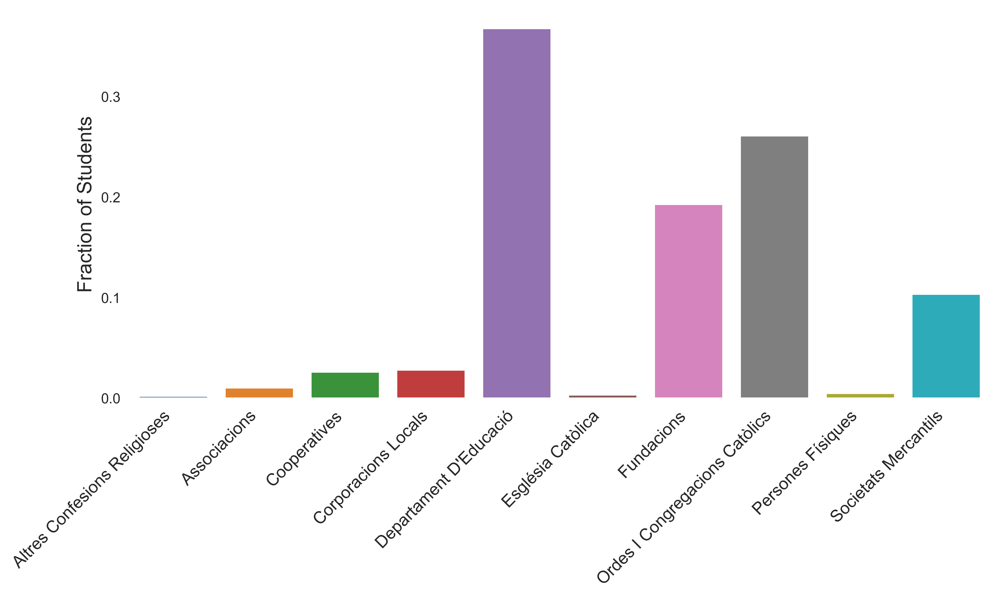

In [589]:
try:
    TAB20_CMAP = plt.colormaps['tab20']
except KeyError:
    TAB20_CMAP = plt.cm.get_cmap('tab20')
    
CUSTOM_COLORS = [TAB20_CMAP(16), TAB20_CMAP(8), TAB20_CMAP(18)]
CUSTOM_COLORMAP = mcolors.ListedColormap(CUSTOM_COLORS)
CUSTOM_COLOR_LIST = [CUSTOM_COLORMAP(i) for i in range(CUSTOM_COLORMAP.N)]

df['Titularitat_Clean'] = df['Titularitat'].astype(str).str.strip().str.upper()

plot2_total = df.groupby(['Titularitat_Clean'])['Alumnes avaluats'].sum().reset_index()
total_students = plot2_total['Alumnes avaluats'].sum()
plot2_total['Proportion'] = plot2_total['Alumnes avaluats'] / total_students
num_titularidades = plot2_total['Titularitat_Clean'].nunique()

TAB20_COLORS_P1 = [TAB20_CMAP(i * 2) for i in range(num_titularidades)]

plot3_data_long = (df.groupby(['Titularitat_Clean', "Resultat de l'avaluació"])['Alumnes avaluats'].sum().reset_index(name='Alumnes'))
total_alumnes_by_titularitat = plot3_data_long.groupby('Titularitat_Clean')['Alumnes'].transform('sum')
plot3_data_long['Proportion'] = plot3_data_long['Alumnes'] / total_alumnes_by_titularitat

NEW_LEGEND_LABELS = {'PROMOCIONEN SENSE PENDENTS': 'Promote without pending subjects','PROMOCIONEN AMB PENDENTS': 'Promote with pending subjects','NO PROMOCIONEN': 'Do not promote'}


plt.figure(figsize=(10, 6), dpi=500)
ax1 = sns.barplot(data=plot2_total, x='Titularitat_Clean', y='Proportion', palette=TAB20_COLORS_P1, hue='Titularitat_Clean', legend=False)
ax1.set_xlabel(None)
ax1.set_ylabel("Fraction of Students", fontsize=14)
ax1.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
ax1.set_xticklabels([label.get_text().title() for label in ax1.get_xticklabels()], rotation=45, ha='right', fontsize=12)
for spine in ax1.spines.values():
    spine.set_visible(False)
ax1.grid(False)
plt.tight_layout()
plt.savefig('data_Anna/fractionstudents.png', dpi=500)
plt.show()


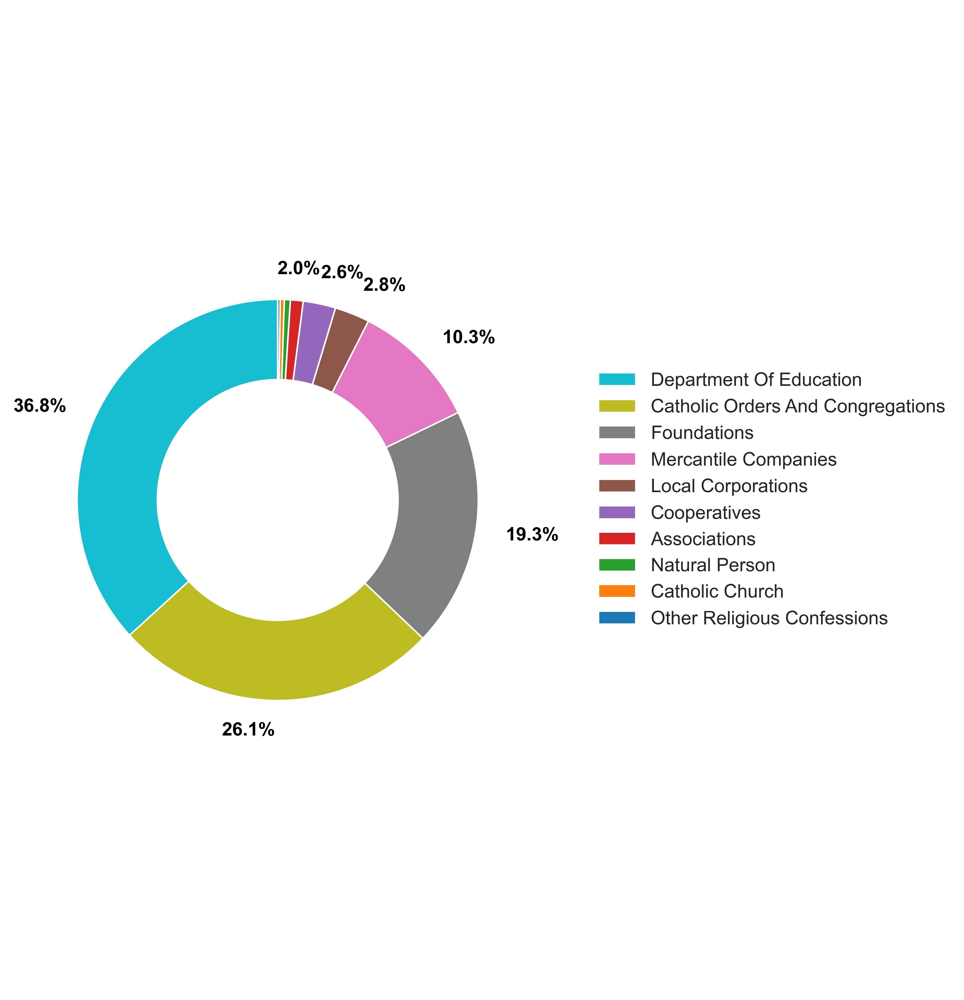

In [643]:
TITULARITAT_RENAME = {'DEPARTAMENT D\'EDUCACIÓ': 'Department of Education','ORDES I CONGREGACIONS CATÒLICS': 'Catholic Orders and Congregations','FUNDACIONS':'Foundations','SOCIETATS MERCANTILS':'Mercantile Companies','CORPORACIONS LOCALS':'Local Corporations','COOPERATIVES':'Cooperatives','ASSOCIACIONS':'Associations','PERSONES FÍSIQUES':'Natural Person','ESGLÉSIA CATÒLICA':'Catholic Church','ALTRES CONFESIONS RELIGIOSES':'Other Religious Confessions'}

try:
    TAB20_CMAP = plt.colormaps['tab20']
except KeyError:
    TAB20_CMAP = plt.cm.get_cmap('tab20')

num_titularidades = plot2_total['Titularitat_Clean'].nunique()
TAB20_COLORS_P1_original = [TAB20_CMAP(i * 2) for i in range(num_titularidades)]

plot_data_final = plot2_total.sort_values(by='Proportion', ascending=False).reset_index(drop=True)

if TITULARITAT_RENAME:
    plot_data_final['Titularitat_Clean'] = plot_data_final['Titularitat_Clean'].replace(TITULARITAT_RENAME)
    
colors_all = TAB20_COLORS_P1_original[::-1]
NUM_TO_GROUP = 4
num_individual = len(plot_data_final) - NUM_TO_GROUP

if num_individual < 1:
    sum_grouped_proportion = 1.0
else:
    sum_grouped_proportion = plot_data_final.iloc[num_individual:]['Proportion'].sum()
    sum_percentage_label = f"{sum_grouped_proportion * 100:.1f}%"

    
plt.figure(figsize=(12, 10), dpi=500)
ax = plt.gca()
wedges, texts = ax.pie(plot_data_final['Proportion'], colors=colors_all, startangle=90, wedgeprops=dict(width=0.4, edgecolor='w'))
r_text = 1.15
for i, (wedge, proportion) in enumerate(zip(wedges, plot_data_final['Proportion'])):
    mid_angle = (wedge.theta1 + wedge.theta2) / 2
    percentage_to_show = None
    if i < num_individual:
        percentage_to_show = f"{proportion * 100:.1f}%"
        if i == num_individual - 1:
            mid_angle = mid_angle + 1.2
    elif i == num_individual:
        percentage_to_show = sum_percentage_label
        mid_angle = mid_angle + 5.5
    if percentage_to_show:
        theta_rad = np.deg2rad(mid_angle)
        x = r_text * np.cos(theta_rad)
        y = r_text * np.sin(theta_rad)
        if mid_angle > 270 or mid_angle < 90:
            horizontalalignment = 'left'
        else:
            horizontalalignment = 'right'
        ax.text(x, y, percentage_to_show, ha=horizontalalignment, va='center', fontsize=12, color='black', fontweight='bold')


ax.legend(wedges, plot_data_final['Titularitat_Clean'].str.title(), title=None, loc="center left", bbox_to_anchor=(1.07, 0, 0.5, 1), frameon=False, fontsize=12)
ax.axis('equal')
ax.set_aspect('equal')
plt.tight_layout(rect=(0.05, 0.05, 0.8, 1))
plt.savefig('data_Anna/donut.png', dpi=500)
plt.show()


In [ ]:
# results of students by ownership and titularity of the school

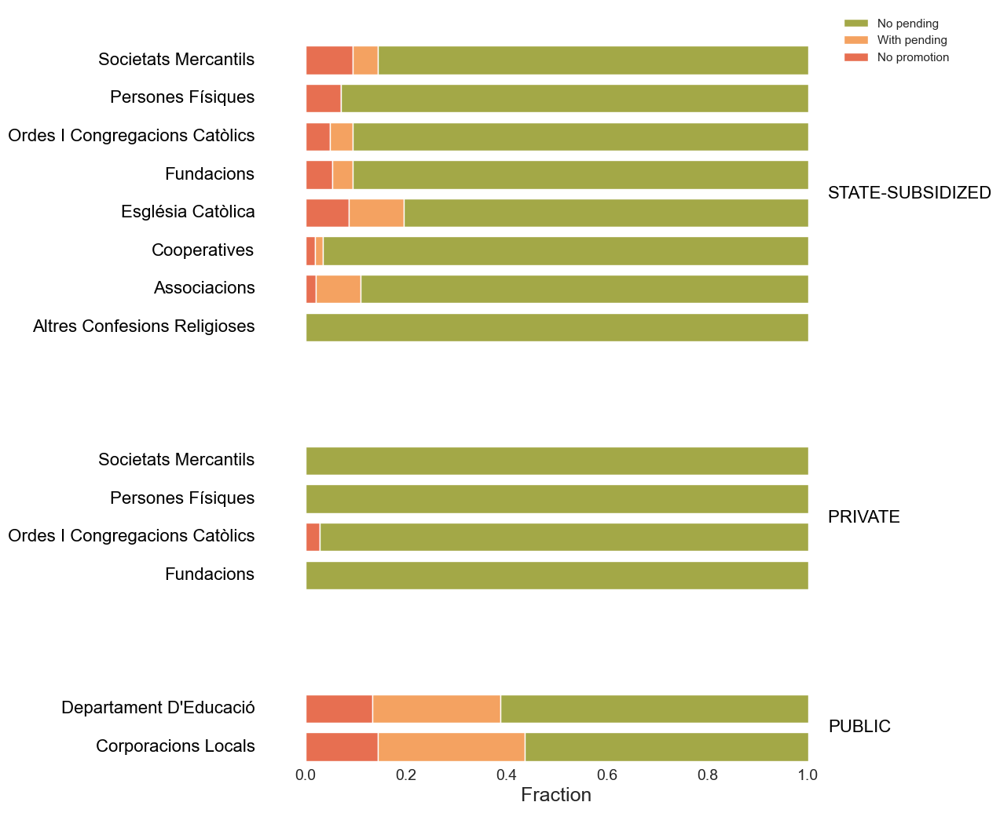


Detailed breakdown of evaluation results by School Type Detailed, Titularitat, and Resultat:
                                                    Alumnes avaluats  \
Resultat de l'avaluació                               NO PROMOCIONEN   
School_Type_Detailed Titularitat                                       
CONCERTAT            ALTRES CONFESIONS RELIGIOSES                NaN   
                     ASSOCIACIONS                                3.0   
                     COOPERATIVES                                7.0   
                     ESGLÉSIA CATÒLICA                           4.0   
                     FUNDACIONS                                142.0   
                     ORDES I CONGREGACIONS CATÒLICS            180.0   
                     PERSONES FÍSIQUES                           4.0   
                     SOCIETATS MERCANTILS                      123.0   
PRIVAT SENSE CONCERT FUNDACIONS                                  NaN   
                     ORDES I CONGREGACIONS

In [607]:
df['Naturalesa_Clean'] = df['Naturalesa'].astype(str).str.strip().str.upper()
df['Concert_Clean'] = df['Concert'].astype(str).str.strip().str.upper()

def classify_school_type_detailed(row):
    if row['Naturalesa_Clean'] == 'PÚBLIC':
        return 'PÚBLIC'
    elif row['Naturalesa_Clean'] == 'PRIVAT':
        if row['Concert_Clean'] == 'SI':
            return 'CONCERTAT'
        elif row['Concert_Clean'] == 'NO':
            return 'PRIVAT SENSE CONCERT'
    return 'OTRO' 

df['School_Type_Detailed'] = df.apply(classify_school_type_detailed, axis=1)

analysis = df.groupby(['School_Type_Detailed', 'Titularitat', "Resultat de l'avaluació"])['Alumnes avaluats'].sum().reset_index()
total_by_tit_detail = analysis.groupby(['School_Type_Detailed', 'Titularitat'])['Alumnes avaluats'].transform('sum')
analysis['Percentage'] = (analysis['Alumnes avaluats'] / total_by_tit_detail) * 100
analysis['Fraction'] = analysis['Alumnes avaluats'] / total_by_tit_detail 
EVAL_ORDER = ['NO PROMOCIONEN', 'PROMOCIONEN AMB PENDENTS', 'PROMOCIONEN SENSE PENDENTS']

pivot_data = analysis.pivot_table(index=['School_Type_Detailed', 'Titularitat'], columns="Resultat de l'avaluació", values='Fraction').fillna(0).reset_index()
pivot_data = pivot_data[['School_Type_Detailed', 'Titularitat'] + EVAL_ORDER]

EVAL_COLOR_MAP = {'NO PROMOCIONEN': '#E76F51', 'PROMOCIONEN AMB PENDENTS': '#F4A261','PROMOCIONEN SENSE PENDENTS': '#A3A847',}
SCHOOL_TYPE_LABELS = {'PRIVAT SENSE CONCERT': 'PRIVATE ','CONCERTAT': 'STATE-SUBSIDIZED','PÚBLIC': 'PUBLIC'}
EVAL_LEGEND_LABELS = {'NO PROMOCIONEN': 'No promotion','PROMOCIONEN AMB PENDENTS': 'With pending','PROMOCIONEN SENSE PENDENTS': 'No pending'}

plt.figure(figsize=(16, 12)) 
ax = plt.gca()

school_type_categories = pivot_data['School_Type_Detailed'].unique()[::-1] 
titularitats_in_group = pivot_data.groupby('School_Type_Detailed')['Titularitat'].apply(list).to_dict()

bar_height = 0.15 
inter_subgroup_spacing = 0.05
group_spacing = 0.5 
y_positions = {}
y_center_positions = {}
current_y = 0

for school_type in school_type_categories:
    subgroups = titularitats_in_group[school_type]
    num_subgroups = len(subgroups)
    group_y_start = current_y + (num_subgroups * bar_height) + ((num_subgroups - 1) * inter_subgroup_spacing) 
    for j, titularitat in enumerate(subgroups):
        y_pos = current_y + (j * (bar_height + inter_subgroup_spacing)) + bar_height / 2
        y_positions[(school_type, titularitat)] = y_pos
    group_center = current_y + (num_subgroups * (bar_height + inter_subgroup_spacing) - inter_subgroup_spacing) / 2
    y_center_positions[school_type] = group_center
    current_y += (num_subgroups * (bar_height + inter_subgroup_spacing)) + group_spacing
plt.ylim(0, current_y - group_spacing + bar_height) 
ax.set_xlim(0, 1) 
GROUP_LABEL_PADDING_X = 0.04 
NEW_GROUP_LABEL_X = ax.get_xlim()[1] + GROUP_LABEL_PADDING_X
TITULARITAT_LABEL_X_POS = -0.10 


legend_handles = {}
for school_type in school_type_categories:
    for titularitat in titularitats_in_group[school_type]:
        y_pos = y_positions[(school_type, titularitat)]
        data = pivot_data[(pivot_data['School_Type_Detailed'] == school_type) & (pivot_data['Titularitat'] == titularitat)].iloc[0]
        left = 0
        for result in EVAL_ORDER:
            fraction = data[result]
            bar_handle = ax.barh( y_pos, fraction, height=bar_height,left=left,color=EVAL_COLOR_MAP[result],)
            if result not in legend_handles:
                legend_handles[result] = bar_handle
            left += fraction
        ax.text(TITULARITAT_LABEL_X_POS, y_pos, titularitat.title(), ha='right', va='center', fontsize=16,color='black')
for school_type, y_center in y_center_positions.items():
    label_text = SCHOOL_TYPE_LABELS.get(school_type, school_type)
    ax.text(NEW_GROUP_LABEL_X, y_center, label_text,ha='left', va='center',fontsize=16,color='black')
ax.set_yticks([]) 
ax.set_yticklabels([]) 
ax.tick_params(axis='both', labelsize=14)
EVAL_ORDER_LEGEND = EVAL_ORDER[::-1] 
handles = [legend_handles[result] for result in EVAL_ORDER_LEGEND]
labels = [EVAL_LEGEND_LABELS[result] for result in EVAL_ORDER_LEGEND]

ax.legend(handles,labels,title='', bbox_to_anchor=(1.05, 1), loc='upper left',frameon=False,fontsize=11)
ax.set_xlabel('Fraction', fontsize=18)
ax.text(-0.35, current_y / 2, '', ha='center', va='center', fontsize=18,rotation='vertical')

ax.grid(None) 
for spine in ax.spines.values():
    spine.set_visible(False)
plt.subplots_adjust(left=0.25, right=0.65, bottom=0.1, top=0.9)
plt.savefig('data_Anna/titularidad.png', dpi = 500)
plt.show()

print(analysis.pivot_table(index=['School_Type_Detailed', 'Titularitat'], columns="Resultat de l'avaluació", values=['Alumnes avaluats', 'Fraction']))

In [ ]:
#calcul del percentatge (prenent com a total els alumnes de un tipus d'escola) d'alumnes per titularitat del centre

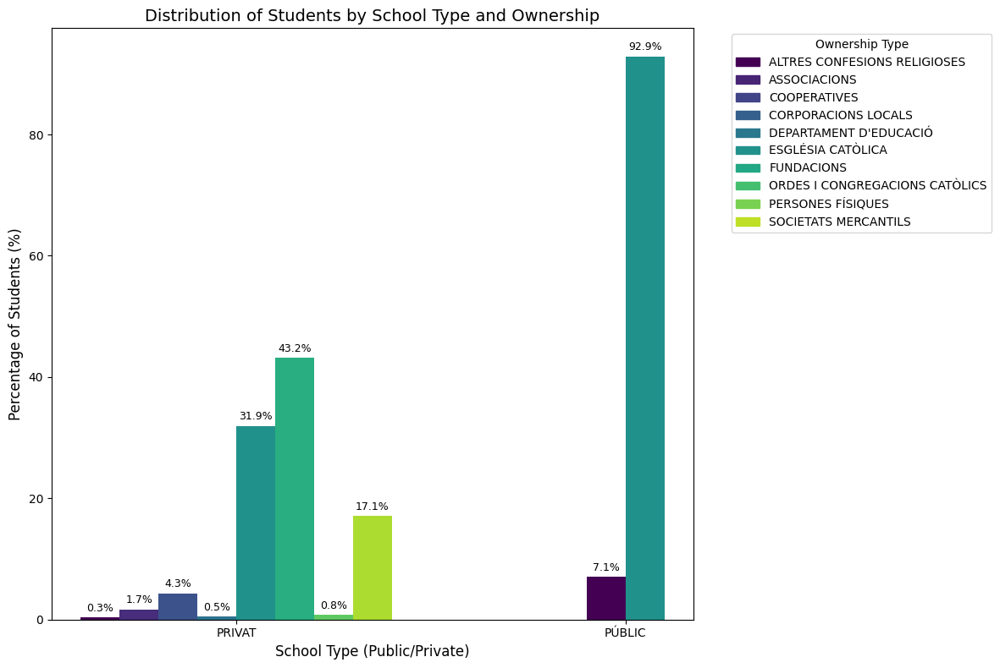


Detailed breakdown of students by school type and ownership:
                               Alumnes avaluats         Percentage           
Naturalesa                               PRIVAT  PÚBLIC     PRIVAT     PÚBLIC
Titularitat                                                                  
ALTRES CONFESIONS RELIGIOSES               28.0     NaN   0.328754        NaN
ASSOCIACIONS                              145.0     NaN   1.702477        NaN
COOPERATIVES                              369.0     NaN   4.332511        NaN
CORPORACIONS LOCALS                         NaN   397.0        NaN   7.112146
DEPARTAMENT D'EDUCACIÓ                      NaN  5185.0        NaN  92.887854
ESGLÉSIA CATÒLICA                          46.0     NaN   0.540096        NaN
FUNDACIONS                               2721.0     NaN  31.947869        NaN
ORDES I CONGREGACIONS CATÒLICS           3681.0     NaN  43.219443        NaN
PERSONES FÍSIQUES                          68.0     NaN   0.798403        NaN
SO

In [10]:
ownership_analysis = df.groupby(['Naturalesa', 'Titularitat'])['Alumnes avaluats'].sum().reset_index()
total_by_naturalesa = ownership_analysis.groupby('Naturalesa')['Alumnes avaluats'].transform('sum')
ownership_analysis['Percentage'] = (ownership_analysis['Alumnes avaluats'] / total_by_naturalesa) * 100

plt.figure(figsize=(12, 8))
naturalesa_categories = ownership_analysis['Naturalesa'].unique()
titularitat_categories = {}

for nat in naturalesa_categories:
    titularitat_categories[nat] = ownership_analysis[ownership_analysis['Naturalesa'] == nat]['Titularitat'].unique()
    
for i, naturalesa in enumerate(naturalesa_categories):
    group_data = ownership_analysis[ownership_analysis['Naturalesa'] == naturalesa]
    n_bars = len(group_data)
    bar_width = 0.8 / max(len(titularitat_categories[nat]) for nat in naturalesa_categories)
    for j, (_, row) in enumerate(group_data.iterrows()):
        if n_bars < len(titularitat_categories[naturalesa_categories[0]]):
            offset = bar_width * (j - (n_bars-1)/2)
            x_pos = i + offset
        else:
            x_pos = i - 0.4 + bar_width/2 + j*bar_width
        plt.bar(x_pos, row['Percentage'], width=bar_width, color=plt.cm.viridis(j/len(titularitat_categories[naturalesa])), label=row['Titularitat'] if i == 0 and j < len(titularitat_categories[naturalesa]) else "")
        plt.text(x_pos, row['Percentage'] + 1, f'{row["Percentage"]:.1f}%', ha='center', fontsize=9)

        
plt.xticks(range(len(naturalesa_categories)), naturalesa_categories)
plt.xlabel('School Type (Public/Private)', fontsize=12)
plt.ylabel('Percentage of Students (%)', fontsize=12)
all_titularitats = []
for nat in naturalesa_categories:
    all_titularitats.extend(titularitat_categories[nat])
unique_titularitats = sorted(set(all_titularitats))
handles = [plt.Rectangle((0,0),1,1, color=plt.cm.viridis(i/len(unique_titularitats))) for i in range(len(unique_titularitats))]

plt.legend(handles, unique_titularitats, title='Ownership Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

pivot_table = ownership_analysis.pivot_table(index='Titularitat', columns='Naturalesa', values=['Alumnes avaluats', 'Percentage'])
print(pivot_table)


In [ ]:
#mapeig dels districtes de barcelona

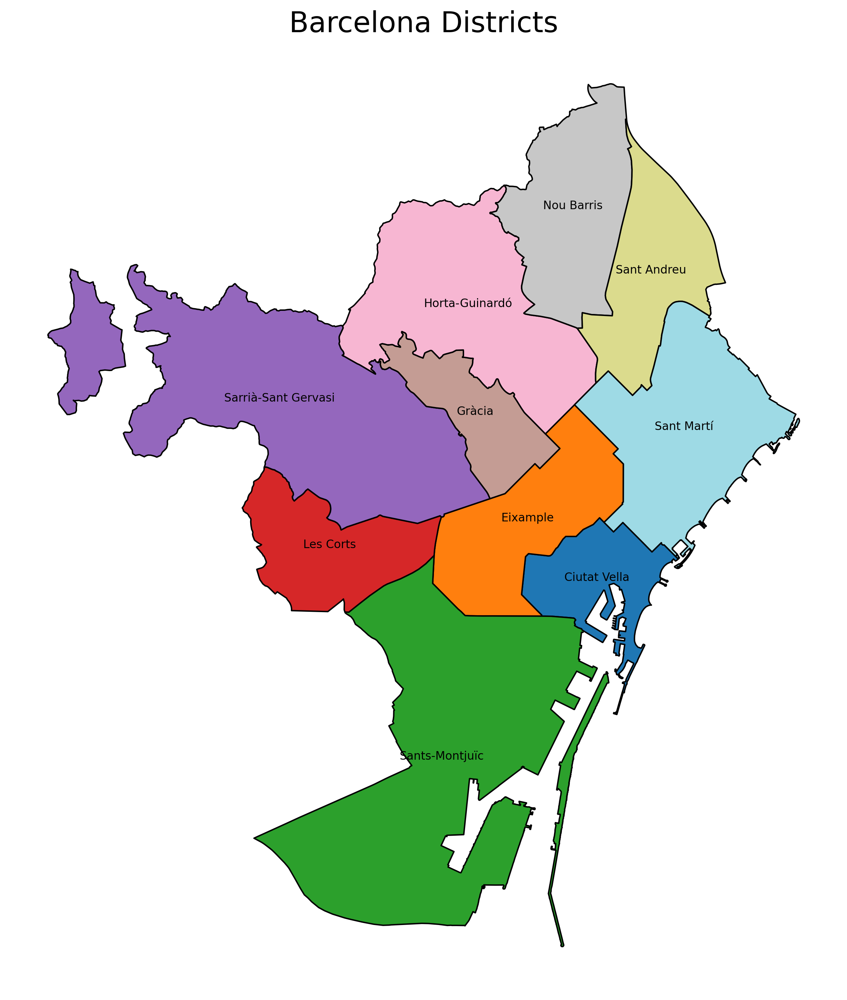

In [15]:
districtsdf = pd.read_json("/Users/34633/avdata/truco-o-dato/data/BarcelonaCiutat_Districtes.json")

districtsdf['geometry'] = districtsdf['geometria_etrs89'].apply(wkt.loads)

districts = gpd.GeoDataFrame(districtsdf, geometry='geometry')
districts.set_crs(epsg=25831, inplace=True) 
districts = districts.to_crs(epsg=4326)
"""
set_crs() Label your coordinates with the correct system
to_crs() Convert your coordinates into a new system
"""

fig, ax = plt.subplots(figsize=(12,12), dpi=300)
districts.plot(ax=ax, edgecolor='black', cmap='tab20')
for idx, row in districts.iterrows():
    plt.annotate(text=row['nom_districte'],xy=(row.geometry.centroid.x, row.geometry.centroid.y),horizontalalignment='center',fontsize=8, color='black')
    
plt.title("Barcelona Districts", fontsize=20)
plt.axis('off')
plt.show()

In [16]:
print(districts['nom_districte'].tolist())

['Ciutat Vella', 'Eixample', 'Sants-Montjuïc', 'Les Corts', 'Sarrià-Sant Gervasi', 'Gràcia', 'Horta-Guinardó', 'Nou Barris', 'Sant Andreu', 'Sant Martí']


In [25]:
df.head()

,Municipi,District_Name,Naturalesa,Titularitat,Alumnes avaluats,Sexe,Concert,Resultat de l'avaluació,NO PROMOCIONEN,PROP_NO_PROMOCIONEN,TOTAL_STUDENTS
13,BARCELONA,CIUTAT VELLA,PRIVAT,FUNDACIONS,2,DONA,SI,NO PROMOCIONEN,0,NaN,0
14,BARCELONA,CIUTAT VELLA,PRIVAT,FUNDACIONS,25,DONA,SI,PROMOCIONEN SENSE PENDENTS,0,NaN,0
15,BARCELONA,CIUTAT VELLA,PRIVAT,FUNDACIONS,5,HOME,SI,NO PROMOCIONEN,0,NaN,0
16,BARCELONA,CIUTAT VELLA,PRIVAT,FUNDACIONS,24,HOME,SI,PROMOCIONEN SENSE PENDENTS,0,NaN,0
17,BARCELONA,CIUTAT VELLA,PRIVAT,FUNDACIONS,2,NINF,SI,PROMOCIONEN AMB PENDENTS,0,NaN,0


In [49]:
df_counts = df_counts.reset_index()
df_counts.head()

Resultat de l'avaluació,index,District_Name,NO PROMOCIONEN,PROMOCIONEN AMB PENDENTS,PROMOCIONEN SENSE PENDENTS,TOTAL
0,0,Ciutat Vella,151,629,1485,2265
1,1,Eixample,288,1241,6029,7558
2,2,Gràcia,65,402,2673,3140
3,3,Horta-Guinardó,188,1284,4611,6083
4,4,Les Corts,103,741,4114,4958


In [ ]:
#mapping entre resultats i districtes de barcelona. un mapa per cada resultat amb la seva corresponent distribució per districte

C:\Users\34633\AppData\Local\Temp\ipykernel_13928\3131682196.py:4: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  district_summary = df_counts.groupby('District_Name').apply(


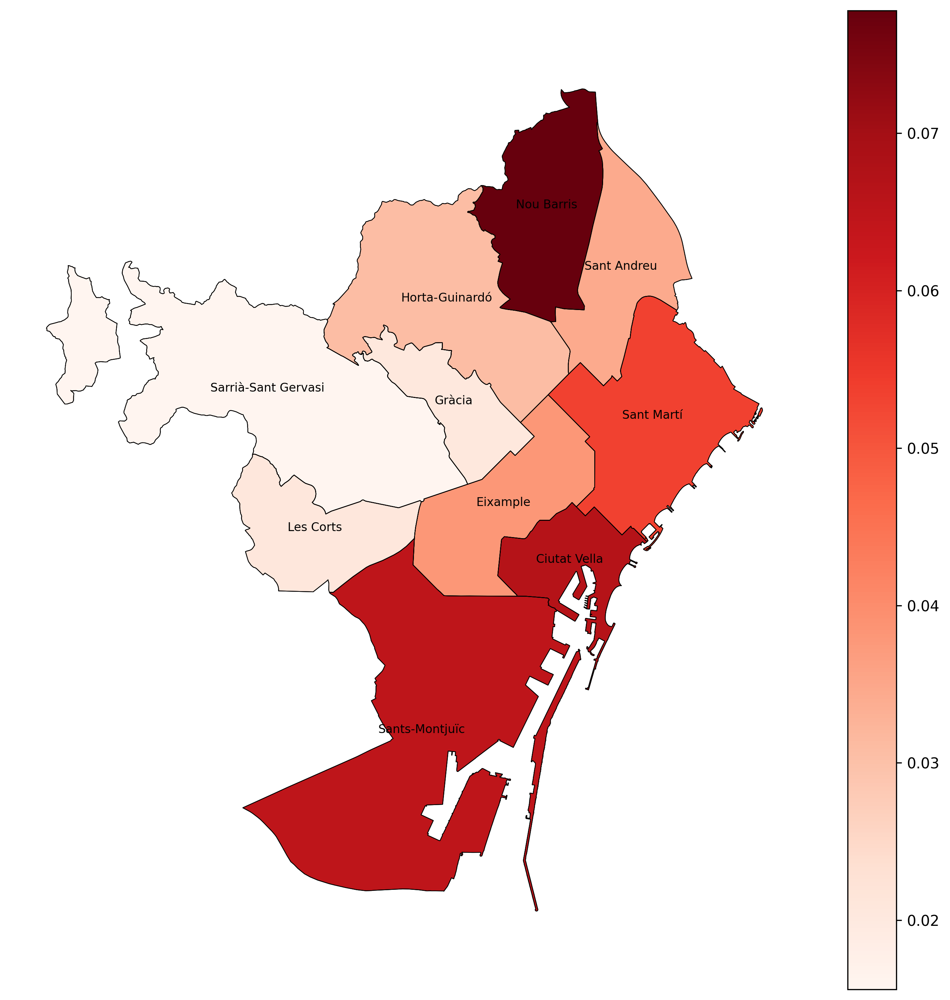

In [51]:
districts['nom_districte'] = districts['nom_districte'].str.strip().str.upper()
df_counts['District_Name'] = df_counts['District_Name'].str.strip().str.upper()

district_summary = df_counts.groupby('District_Name').apply( lambda x: pd.Series({'NO_PROMOCIONEN': x['NO PROMOCIONEN'].sum(),'PROMO_PEND': x['PROMOCIONEN AMB PENDENTS'].sum(),'PROMO_SENSE': x['PROMOCIONEN SENSE PENDENTS'].sum(), })).reset_index()
district_summary['TOTAL_ALUMNES'] = (district_summary['NO_PROMOCIONEN'] +district_summary['PROMO_PEND'] + district_summary['PROMO_SENSE'])
district_summary['PROP_NO_PROMOCIONEN'] = (district_summary['NO_PROMOCIONEN'] / district_summary['TOTAL_ALUMNES'])
districts_merged = districts.merge(district_summary[['District_Name', 'NO_PROMOCIONEN', 'PROP_NO_PROMOCIONEN']],left_on='nom_districte',right_on='District_Name', how='left')
districts_merged['PROP_NO_PROMOCIONEN'] = districts_merged['PROP_NO_PROMOCIONEN'].fillna(0)
districts_merged['NO_PROMOCIONEN'] = districts_merged['NO_PROMOCIONEN'].fillna(0)

fig, ax = plt.subplots(figsize=(12, 12), dpi=300)
districts_merged.boundary.plot(color='black', linewidth=0.5, ax=ax)
districts_merged.plot(column='PROP_NO_PROMOCIONEN', cmap='Reds', legend=True, edgecolor='black', linewidth=0.5, ax=ax)

for idx, row in districts_merged.iterrows():
    plt.annotate(text=row['nom_districte'].title(), xy=(row.geometry.centroid.x, row.geometry.centroid.y), horizontalalignment='center', fontsize=8, color='black')

plt.axis('off')
plt.show()

In [ ]:
#punt de control de dades per entendre el contingut

In [644]:
districts['nom_districte'] = districts['nom_districte'].str.strip().str.upper()

if 'District_Name' in df.columns:
    df['District_Name'] = df['District_Name'].str.strip().str.upper()
elif 'Districte' in df.columns:
    df['District_Name'] = df['Districte'].str.strip().str.upper()
else:
    print("baaaad ")
    
print(df[['District_Name', 'Alumnes avaluats', "Resultat de l\'avaluació"]].head(10))

total_by_district = df.groupby('District_Name')['Alumnes avaluats'].sum().reset_index()
print(total_by_district)

result_counts = df.groupby(['District_Name', "Resultat de l\'avaluació"])['Alumnes avaluats'].sum().reset_index()
print(result_counts)

district_summary = df.groupby('District_Name').apply( lambda x: pd.Series({ 'TOTAL_ALUMNES': x['Alumnes avaluats'].sum(),
                                                                           'PROMOCIONEN_TOTAL': x[x["Resultat de l\'avaluació"].isin(['PROMOCIONEN AMB PENDENTS', 'PROMOCIONEN SENSE PENDENTS'])]['Alumnes avaluats'].sum(),'PROMOCIONEN_AMB_PENDENTS': x[x["Resultat de l\'avaluació"] == 'PROMOCIONEN AMB PENDENTS']['Alumnes avaluats'].sum(),'PROMOCIONEN_SENSE_PENDENTS': x[x["Resultat de l\'avaluació"] == 'PROMOCIONEN SENSE PENDENTS']['Alumnes avaluats'].sum(), 'NO_PROMOCIONEN': x[x["Resultat de l\'avaluació"] == 'NO PROMOCIONEN']['Alumnes avaluats'].sum(),})).reset_index()
district_summary['VERIFICATION'] = district_summary['PROMOCIONEN_TOTAL'] + district_summary['NO_PROMOCIONEN']
district_summary['MATCHES'] = district_summary['VERIFICATION'] == district_summary['TOTAL_ALUMNES']

print("\nVerification of calculations:")
print(district_summary[['District_Name', 'TOTAL_ALUMNES', 'PROMOCIONEN_TOTAL', 'NO_PROMOCIONEN', 'VERIFICATION', 'MATCHES']])

district_summary['PROP_PROMOCIONEN_TOTAL'] = district_summary['PROMOCIONEN_TOTAL'] / district_summary['TOTAL_ALUMNES']
district_summary['PROP_PROMOCIONEN_AMB_PENDENTS'] = district_summary['PROMOCIONEN_AMB_PENDENTS'] / district_summary['TOTAL_ALUMNES']
district_summary['PROP_PROMOCIONEN_SENSE_PENDENTS'] = district_summary['PROMOCIONEN_SENSE_PENDENTS'] / district_summary['TOTAL_ALUMNES']
district_summary['PROP_NO_PROMOCIONEN'] = district_summary['NO_PROMOCIONEN'] / district_summary['TOTAL_ALUMNES']
districts_merged = districts.merge(district_summary[['District_Name', 'PROMOCIONEN_TOTAL', 'PROP_PROMOCIONEN_TOTAL',  'PROMOCIONEN_AMB_PENDENTS', 'PROP_PROMOCIONEN_AMB_PENDENTS','PROMOCIONEN_SENSE_PENDENTS', 'PROP_PROMOCIONEN_SENSE_PENDENTS','NO_PROMOCIONEN', 'PROP_NO_PROMOCIONEN']], left_on='nom_districte',  right_on='District_Name',  how='left')

for col in ['PROP_PROMOCIONEN_TOTAL', 'PROMOCIONEN_TOTAL', 'PROP_PROMOCIONEN_AMB_PENDENTS', 'PROMOCIONEN_AMB_PENDENTS','PROP_PROMOCIONEN_SENSE_PENDENTS', 'PROMOCIONEN_SENSE_PENDENTS',  'NO_PROMOCIONEN', 'PROP_NO_PROMOCIONEN']: districts_merged[col] = districts_merged[col].fillna(0)
print(districts_merged[['nom_districte', 'District_Name', 'PROMOCIONEN_TOTAL', 'PROP_PROMOCIONEN_TOTAL']].head())

districts_merged.head()

KeyError: 'nom_districte'

In [ ]:
#mapping entre resultats i districtes de barcelona. un mapa per cada resultat amb la seva corresponent distribució per districte

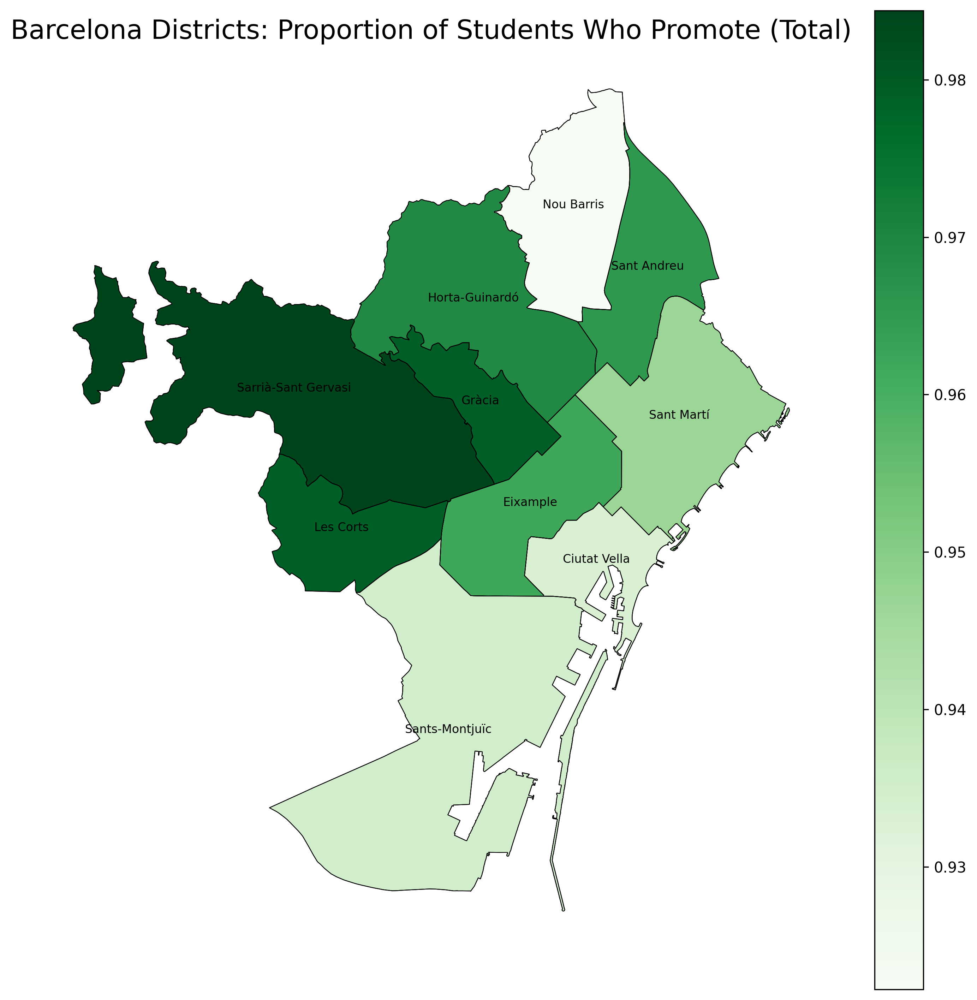

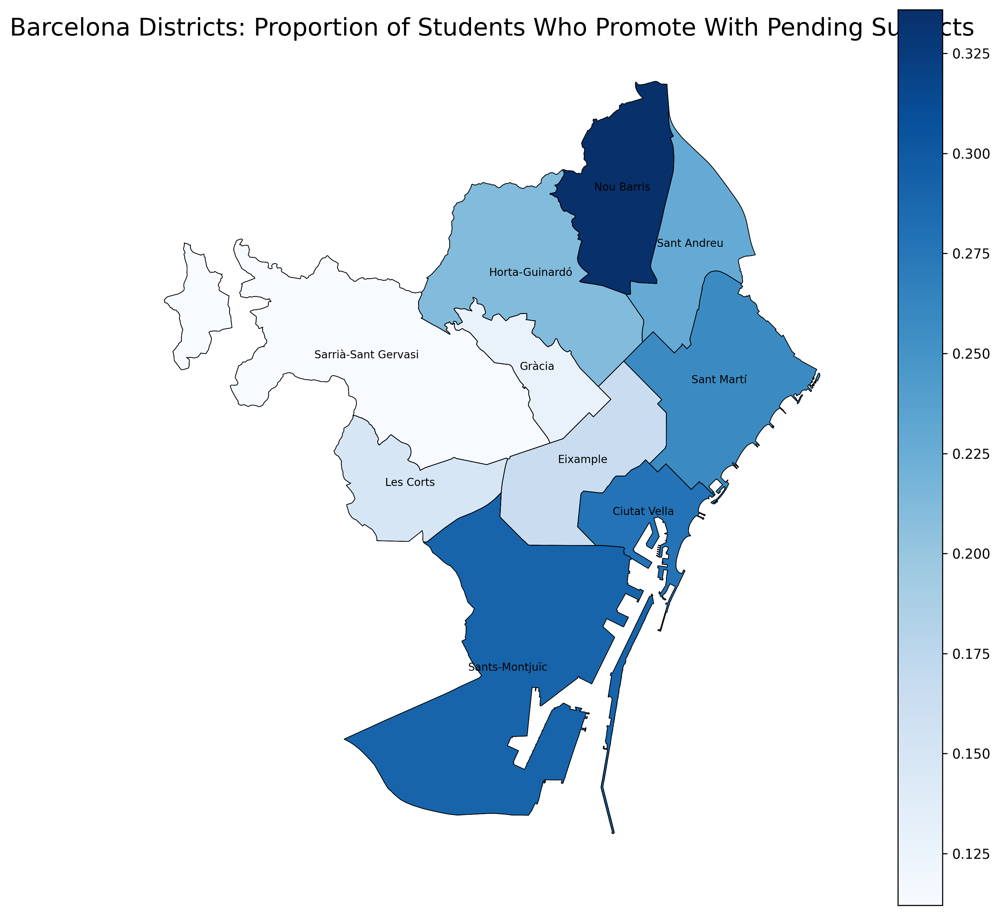

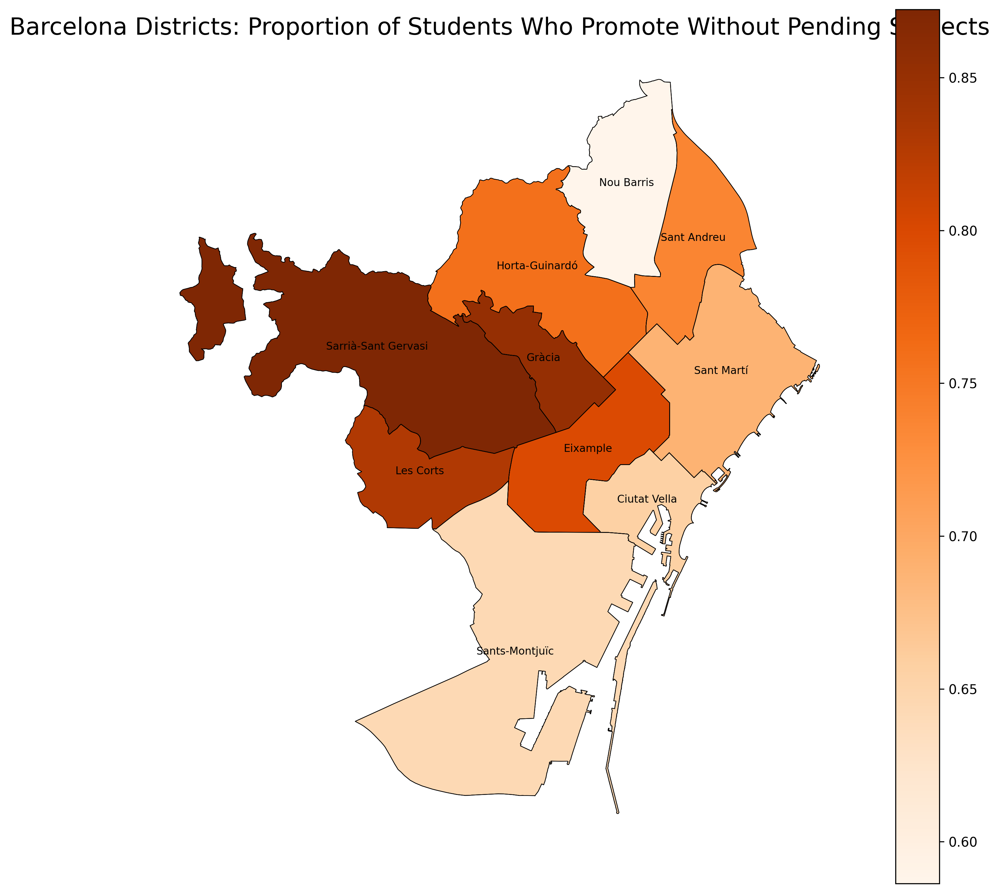

In [54]:
districts['nom_districte'] = districts['nom_districte'].str.strip().str.upper()
df_norm['District_Name'] = df_norm['District_Name'].str.strip().str.upper()
df_norm['TOTAL_ALUMNES'] = (df_norm['NO PROMOCIONEN'] +df_norm['PROMOCIONEN AMB PENDENTS'] +df_norm['PROMOCIONEN SENSE PENDENTS'])
df_norm['PROP_NO_PROMOCIONEN'] = df_norm['NO PROMOCIONEN'] / df_norm['TOTAL_ALUMNES']
df_norm['PROP_PROMOCIONEN_AMB_PENDENTS'] = df_norm['PROMOCIONEN AMB PENDENTS'] / df_norm['TOTAL_ALUMNES']
df_norm['PROP_PROMOCIONEN_SENSE_PENDENTS'] = df_norm['PROMOCIONEN SENSE PENDENTS'] / df_norm['TOTAL_ALUMNES']
df_norm['PROP_PROMOCIONEN_TOTAL'] = ( df_norm['PROMOCIONEN AMB PENDENTS'] +df_norm['PROMOCIONEN SENSE PENDENTS']) / df_norm['TOTAL_ALUMNES']
districts_merged = districts.merge(df_norm,left_on='nom_districte',right_on='District_Name',how='left')

for col in df_norm.columns:
    if col != "District_Name":
        districts_merged[col] = districts_merged[col].fillna(0)

fig, ax = plt.subplots(figsize=(12, 12), dpi=300)
districts_merged.boundary.plot(color='black', linewidth=0.5, ax=ax)
districts_merged.plot( column='PROP_PROMOCIONEN_TOTAL', cmap='Greens', legend=True,edgecolor='black',linewidth=0.5,ax=ax)
for idx, row in districts_merged.iterrows():
    plt.annotate( text=row['nom_districte'].title(), xy=(row.geometry.centroid.x, row.geometry.centroid.y), horizontalalignment='center', fontsize=8,  color='black' )
plt.title("Barcelona Districts: Proportion of Students Who Promote (Total)", fontsize=18)
plt.axis('off')
plt.show()

fig, ax = plt.subplots(figsize=(12, 12), dpi=300)
districts_merged.boundary.plot(color='black', linewidth=0.5, ax=ax)
districts_merged.plot( column='PROP_PROMOCIONEN_AMB_PENDENTS', cmap='Blues', legend=True, edgecolor='black', linewidth=0.5,ax=ax)
for idx, row in districts_merged.iterrows():
    plt.annotate( text=row['nom_districte'].title(),  xy=(row.geometry.centroid.x, row.geometry.centroid.y),horizontalalignment='center',fontsize=8, color='black' )

plt.title("Barcelona Districts: Proportion of Students Who Promote With Pending Subjects", fontsize=18)
plt.axis('off')
plt.show()

fig, ax = plt.subplots(figsize=(12, 12), dpi=300)
districts_merged.boundary.plot(color='black', linewidth=0.5, ax=ax)
districts_merged.plot(column='PROP_PROMOCIONEN_SENSE_PENDENTS', cmap='Oranges', legend=True, edgecolor='black', linewidth=0.5, ax=ax)
for idx, row in districts_merged.iterrows():
    plt.annotate( text=row['nom_districte'].title(), xy=(row.geometry.centroid.x, row.geometry.centroid.y), horizontalalignment='center', fontsize=8,color='black')
plt.axis('off')
plt.show()

In [ ]:
#Ullada al df de plantilla de professors a les escoles i veure si hi ha tendències rellevants

In [88]:
profesbcn = pd.read_csv('/Users/34633/avdata/truco-o-dato/data_Anna/plantillaprofes_bcn.csv', sep=',', encoding = 'latin1')
profesbcn.head()
profesbcn['Alumnes - ESO'] = pd.to_numeric(profesbcn['Alumnes - ESO'], errors='coerce')
profesbcn['Unitats concertades - ESO'] = pd.to_numeric(profesbcn['Unitats concertades - ESO'], errors='coerce')
profesbcneso = profesbcn.dropna(subset=['Alumnes - ESO'])
profesbcneso = profesbcneso[profesbcneso['Alumnes - ESO'] != 0]

profesbcneso['Naturalesa'] = profesbcneso['Unitats concertades - ESO'].apply(
    lambda x: 'Públic' if pd.isna(x) or x == 0 else 'Privat')

profesbcneso = profesbcneso.reset_index(drop=True)
profesbcneso.head()

counts = profesbcneso['Naturalesa'].value_counts()
num_publics = counts.get('Públic', 0)
num_privats = counts.get('Privat', 0)
print('Publics', num_publics)
print('Privats', num_privats)

profesbcneso.columns.tolist()

Publics 1
Privats 953


['Codi_centre',
 'Nom_centre',
 'Municipi',
 'Titularitat',
 'Unitats concertades - ESO',
 'Alumnes - ESO',
 'DotaciÃ³ plantilla',
 'NÃ²mina del personal del centre',
 'Despeses de funcionament',
 'Naturalesa']

   Alumnes - ESO  Unitats concertades - ESO  DotaciÃ³ plantilla
0          108.0                        4.0               19.72
1          126.0                        4.0               15.72
2          257.0                        8.0               75.48
3          117.0                        4.0               19.72
4          348.0                       12.0               51.16
     Codi_centre                  Nom_centre   Municipi  \
145      8008191  Santa Maria dels ApÃ²stols  Barcelona   

                              Titularitat  Unitats concertades - ESO  \
145  Creuades de l'EsglÃ©sia, Missioneres                       12.0   

     Alumnes - ESO  DotaciÃ³ plantilla NÃ²mina del personal del centre  \
145          313.0             42749.0                      1840865,08   

    Despeses de funcionament Naturalesa  
145                266226,72     Privat  
42749.0


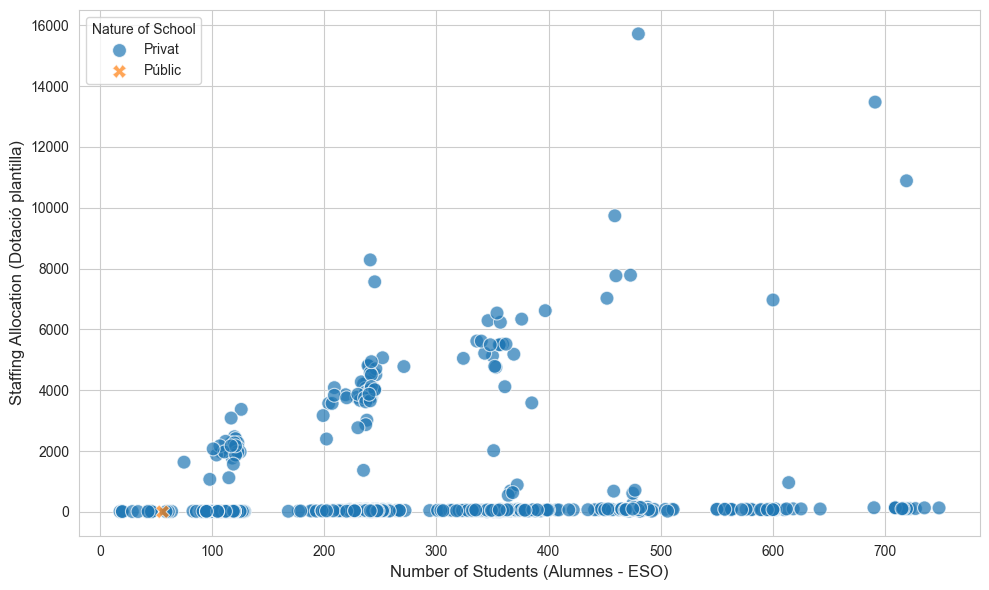

In [110]:
profesbcn = pd.read_csv( '/Users/34633/avdata/truco-o-dato/data_Anna/plantillaprofes_bcn.csv', sep=',', encoding='latin1', quotechar='"'  )
profesbcn.columns = profesbcn.columns.str.strip()
numeric_cols = ['Alumnes - ESO', 'Unitats concertades - ESO', 'DotaciÃ³ plantilla']

for col in numeric_cols:
    profesbcn[col] = (profesbcn[col].astype(str)  .str.replace(',', '.', regex=False)  .str.replace(r'[^\d\.]', '', regex=True)  )
    profesbcn[col] = pd.to_numeric(profesbcn[col], errors='coerce')
    
profesbcneso = profesbcn.dropna(subset=['Alumnes - ESO'])
profesbcneso = profesbcneso[profesbcneso['Alumnes - ESO'] != 0]
profesbcneso['Naturalesa'] = profesbcneso['Unitats concertades - ESO'].apply(lambda x: 'Públic' if pd.isna(x) or x == 0 else 'Privat')

profesbcneso = profesbcneso.reset_index(drop=True)
print(profesbcneso[['Alumnes - ESO', 'Unitats concertades - ESO', 'DotaciÃ³ plantilla']].head())

max_point = profesbcneso[profesbcneso['DotaciÃ³ plantilla'] == profesbcneso['DotaciÃ³ plantilla'].max()]
print(max_point)
print(profesbcneso['DotaciÃ³ plantilla'].max())
profesbcneso_without_max = profesbcneso[profesbcneso['DotaciÃ³ plantilla'] != profesbcneso['DotaciÃ³ plantilla'].max()]
sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
sns.scatterplot(data=profesbcneso_without_max, x='Alumnes - ESO', y='DotaciÃ³ plantilla', hue='Naturalesa', style='Naturalesa', s=100, alpha=0.7)         
plt.xlabel('Number of Students (Alumnes - ESO)', fontsize=12)
plt.ylabel('Staffing Allocation (Dotació plantilla)', fontsize=12)
plt.legend(title='Nature of School', loc='upper left')
plt.tight_layout()
plt.show()

In [ ]:
comp = pd.read_csv('/Users/34633/avdata/truco-o-dato/data_Anna/compbasiques4eso_bcn.csv', sep =',', encoding='latin1')
comp.head()

In [ ]:
#Bar plot to compare the scores of students from public and private schools by subject

['Privada' 'Pública']


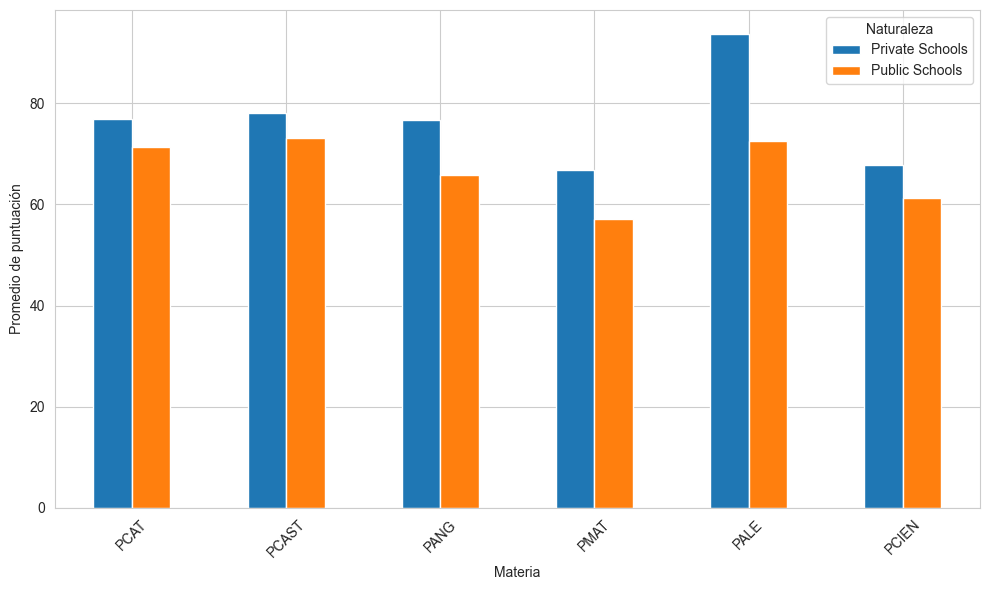

In [304]:
comp["NATURALESA"] = (comp["NATURALESA"].astype(str).str.lower().str.normalize("NFKD").str.encode("ascii", errors="ignore").str.decode("utf-8").str.strip())
comp["NATURALESA"] = comp["NATURALESA"].replace({"publica": "Pública","privada": "Privada"})
print(comp["NATURALESA"].unique())
comp_pp = comp[comp["NATURALESA"].isin(["Privada", "Pública"])].copy()
subjects = ["PCAT", "PCAST", "PANG", "PMAT", "PALE", "PCIEN"]

for subject in subjects:
    comp_pp[subject] = (comp_pp[subject] .astype(str) .str.replace(",", ".", regex=False).str.strip())
    comp_pp[subject] = pd.to_numeric(comp_pp[subject], errors="coerce")

mean_scores = comp_pp.groupby("NATURALESA")[subjects].mean()
mean_scores_plot = mean_scores.rename(index={"Privada": "Private Schools","Pública": "Public Schools"})
ax = mean_scores_plot.T.plot(kind="bar", figsize=(10,6))
plt.xlabel("Materia")
plt.ylabel("Promedio de puntuación")
plt.xticks(rotation=45)
plt.legend(title="Naturaleza")
plt.tight_layout()
plt.show()


In [ ]:
#difference between the mean score of students from public and private schools by subject

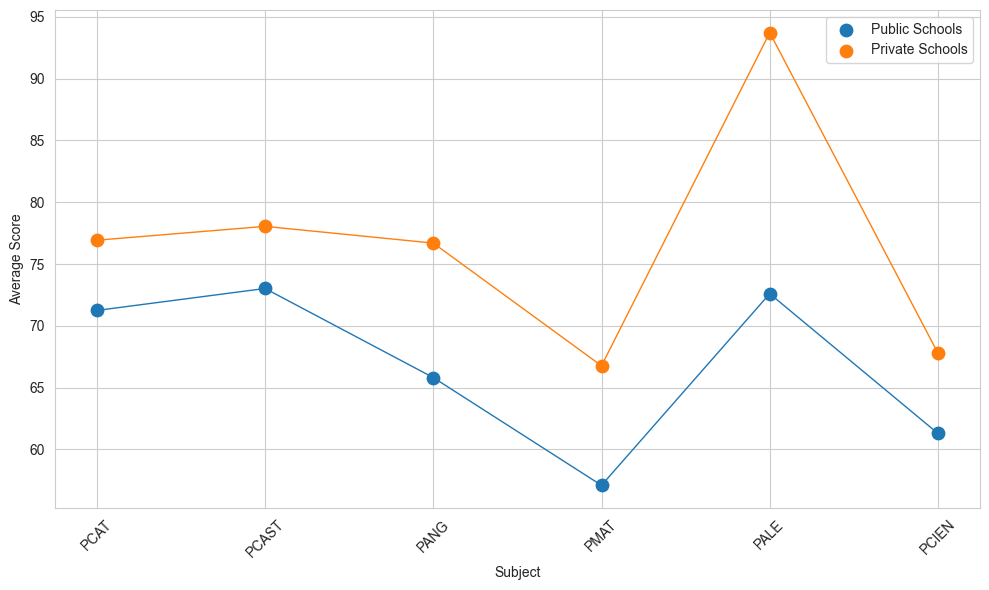

In [305]:
plt.figure(figsize=(10,6))
x = range(len(subjects))
plt.scatter(x,mean_scores.loc["Pública", subjects],label="Public Schools",s=80)
plt.plot(x,mean_scores.loc["Pública", subjects],linewidth=1)
plt.scatter(x,mean_scores.loc["Privada", subjects],label="Private Schools",s=8)
plt.plot( x,mean_scores.loc["Privada", subjects],linewidth=1)
plt.xticks(x, subjects, rotation=45)
plt.ylabel("Average Score")
plt.xlabel("Subject")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
#difference between the mean score of students from public and private schools by subject

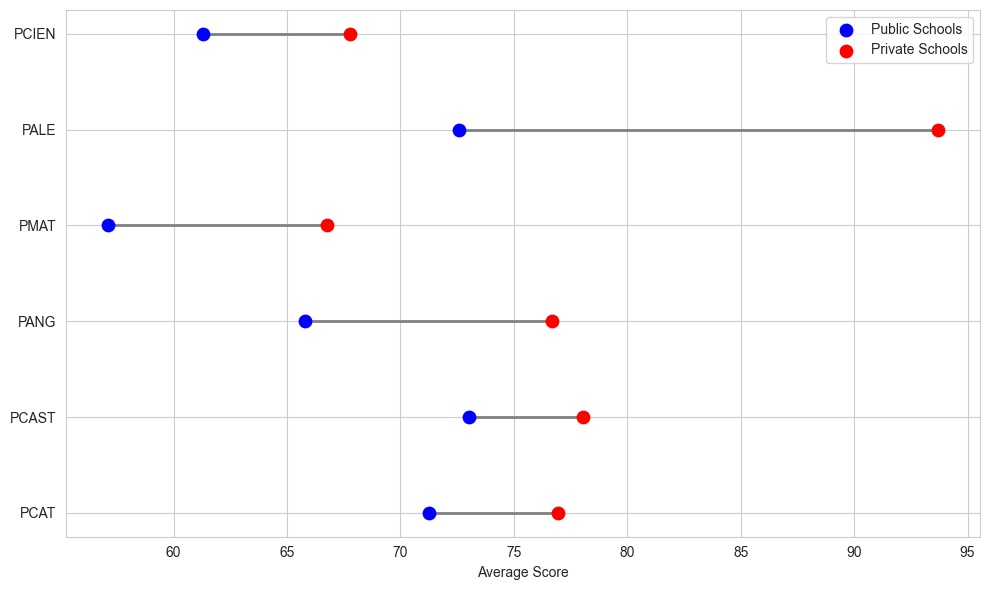

In [306]:
public_vals = mean_scores.loc["Pública", subjects]
private_vals = mean_scores.loc["Privada", subjects]

y_pos = range(len(subjects))

plt.figure(figsize=(10, 6))

for i, subj in enumerate(subjects):plt.plot([public_vals[subj], private_vals[subj]],[i, i],color="gray",linewidth=2,zorder=1)

plt.scatter(public_vals,y_pos,color="blue",s=80,label="Public Schools",zorder=2)
plt.scatter(private_vals,y_pos, color="red", s=80, label="Private Schools", zorder=3)
plt.yticks(y_pos, subjects)
plt.xlabel("Average Score")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
#Comparison of the distribution of the scores of the students in each subject, differentiating students form public and private schools
#Since they are genenral exams for everyone, provides a deeper insight into the inequalities between public and private schools

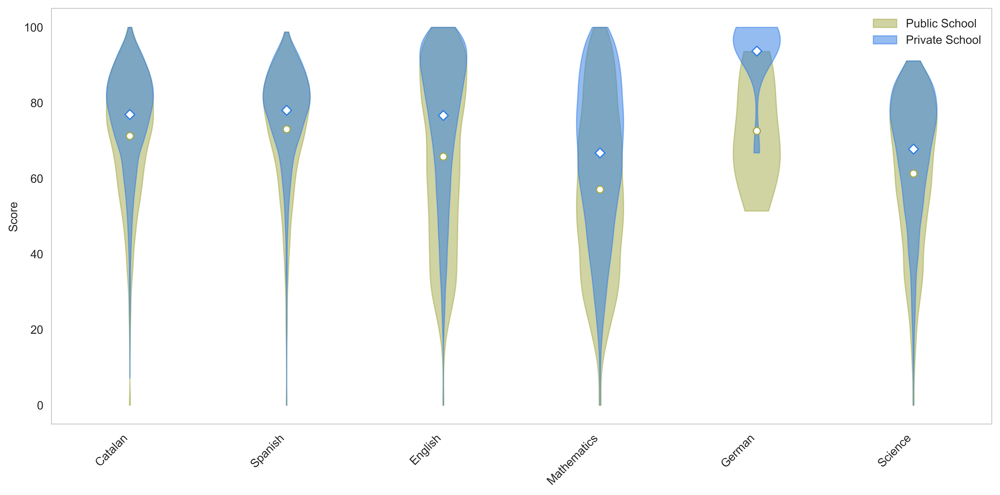

In [531]:
comp_pp['NATURALESA_CLEAN'] = comp_pp['NATURALESA'].astype(str).str.strip().str.upper()
subjects_list = ["PCAT", "PCAST", "PANG", "PMAT", "PALE", "PCIEN"]
school_colors = {"PÚBLICA": '#A3A847', "PRIVADA":'#2C7BE5'}

subject_labels_map = {
    "PCAT": "Catalan", 
    "PCAST": "Spanish", 
    "PANG": "English", 
    "PALE": "German", 
    "PMAT": "Mathematics", 
    "PCIEN": "Science"
}

data_to_plot = []
positions_to_plot = []
subject_tick_positions = []
display_labels = []

for k, subj in enumerate(subjects_list):
    center_pos = k + 1
    public_mask = comp_pp['NATURALESA_CLEAN'] == "PÚBLICA"
    public_data = comp_pp[public_mask][subj].dropna()
    private_mask = comp_pp['NATURALESA_CLEAN'] == "PRIVADA"
    private_data = comp_pp[private_mask][subj].dropna()
    
    if len(public_data) > 0 and len(private_data) > 0:
        data_to_plot.append(public_data.values)
        positions_to_plot.append(center_pos)
        data_to_plot.append(private_data.values)
        positions_to_plot.append(center_pos)
        subject_tick_positions.append(center_pos) 
        display_labels.append(subject_labels_map.get(subj, subj))

plt.figure(figsize=(12, 6), dpi = 500)
parts = plt.violinplot(data_to_plot,  positions=positions_to_plot,  widths=0.3,  showmeans=False,showmedians=False,showextrema=False)

for i, body in enumerate(parts['bodies']):
    is_public = i % 2 == 0
    if is_public: 
        color = school_colors["PÚBLICA"]
        label = "Public School" if i == 0 else "_nolegend_" 
        zorder = 2
    else:
        color = school_colors["PRIVADA"]
        label = "Private School" if i == 1 else "_nolegend_"
        zorder = 3
    body.set_facecolor(color)
    body.set_edgecolor(color)
    body.set_alpha(0.5)
    body.set_label(label)
    body.set_zorder(zorder)

for j, pos in enumerate(subject_tick_positions):
    public_mean = np.mean(data_to_plot[2*j])
    plt.plot(pos, public_mean, marker='o', color='white', markeredgecolor=school_colors["PÚBLICA"], markersize=6, zorder=5) 
    private_mean = np.mean(data_to_plot[2*j + 1])
    plt.plot(pos, private_mean, marker='D', color='white', markeredgecolor=school_colors["PRIVADA"], markersize=6, zorder=5)

plt.xticks(subject_tick_positions, display_labels, rotation=45, ha='right')
plt.xlim(0.5, len(subjects_list) + 0.5) 
plt.ylabel("Score")
plt.grid(False)
plt.legend(loc='upper right', title=None, frameon = False)
plt.savefig('data_Anna/competencies.png', dpi = 500)
plt.tight_layout()
plt.show()

In [ ]:
#Comparison of the distribution of the scores of the students in each subject, differentiating students form public and private schools
#Since they are genenral exams for everyone, provides a deeper insight into the inequalities between public and private schools 

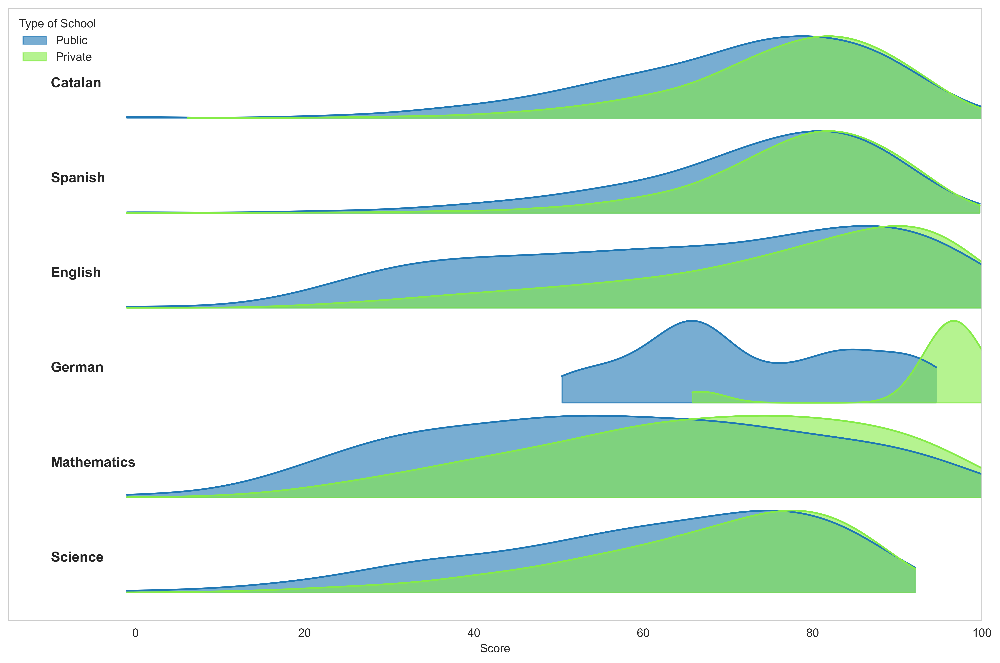

In [389]:
subject_labels = { "PCAT": "Catalan", "PCAST": "Spanish", "PANG": "English",  "PALE": "German",  "PMAT": "Mathematics","PCIEN": "Science"}
tab20 = plt.colormaps.get_cmap('tab20')
school_colors = { "PÚBLICA": '#1f77b4', "PRIVADA":'#85eb47'}
subjects = ["PCAT", "PCAST", "PANG", "PALE", "PMAT", "PCIEN"]
for s in subjects:
    comp_pp[s] = ( comp_pp[s].astype(str).str.replace(",", ".", regex=False) .str.strip() )
    comp_pp[s] = pd.to_numeric(comp_pp[s], errors="coerce")

df_long = comp_pp.melt( id_vars="NATURALESA", value_vars=subjects, var_name="Subject", value_name="Score").dropna()
df_long['NATURALESA'] = df_long['NATURALESA'].astype(str).str.strip().str.upper()

subjects_clean = subjects[::-1]

plt.figure(figsize=(12, 8), dpi=500) 
gap = 1.1
for i, subj in enumerate(subjects_clean):
    subj_label = subject_labels.get(subj, subj)
    public_data = df_long[
        (df_long["Subject"] == subj) & 
        (df_long["NATURALESA"] == "PÚBLICA")
    ]["Score"].values
    
    if len(public_data) >= 2:
        kde_public = gaussian_kde(public_data, bw_method=0.3)
        x_public = np.linspace(np.min(public_data)-1, np.max(public_data)+1, 200)
        y_public = kde_public(x_public)
        y_public = (y_public / y_public.max()) * 0.95
        y_shifted_public = y_public + i * gap
        plt.fill_between(x_public, i * gap, y_shifted_public, color=school_colors["PÚBLICA"], alpha=0.6, label='Public')
        plt.plot(x_public, y_shifted_public, color=school_colors["PÚBLICA"], linewidth=1.5)
        
    private_data = df_long[
        (df_long["Subject"] == subj) & 
        (df_long["NATURALESA"] == "PRIVADA")
    ]["Score"].values
    
    if len(private_data) >= 2:
        kde_private = gaussian_kde(private_data, bw_method=0.3)
        x_private = np.linspace(np.min(private_data)-1, np.max(private_data)+1, 200)
        y_private = kde_private(x_private)
        y_private = (y_private / y_private.max()) * 0.95
        y_shifted_private = y_private + i * gap
        
        plt.fill_between(x_private, i * gap, y_shifted_private, color=school_colors["PRIVADA"], alpha=0.6, label='Private')
        plt.plot(x_private, y_shifted_private, color=school_colors["PRIVADA"], linewidth=1.5)

    if len(public_data) >= 2 or len(private_data) >= 2:
        plt.text(-10, i*gap + 0.4, subj_label, va="center", fontsize=12, fontweight='bold')

handles, labels = plt.gca().get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))
plt.legend(unique_labels.values(), unique_labels.keys(), loc='upper left', title="Type of School", frameon=False)
plt.yticks([])
plt.xlabel("Score")
plt.xlim(-15, 100) 
plt.tight_layout()
plt.grid(False)
plt.savefig('data_Anna/resultatscompetencies.png', dpi=500)
plt.show()


In [ ]:
#Compteig de prova de les escoles per comprovar que s'estiguin llegint bé les dades i tenir una idea general de la distribució dels tipus d'escoles segons naturalesa

In [608]:
colegiosbcn = pd.read_csv("/Users/34633/avdata/truco-o-dato/data_Anna/colegios bcn.csv", sep=";")
colegiosbcn = colegiosbcn.copy()

colegiosbcn["Municipi"] = colegiosbcn["Municipi"].astype(str).str.strip().str.upper()
colegiosbcn_barcelona = colegiosbcn[colegiosbcn["Municipi"] == "BARCELONA"].copy()

colegiosbcn_barcelona["Naturalesa"] = colegiosbcn_barcelona["Naturalesa"].astype(str).str.strip().str.upper()
colegiosbcn_barcelona["Centre amb concert (S/N)"] = colegiosbcn_barcelona["Centre amb concert (S/N)"].astype(str).str.strip().str.upper()
colegiosbcn_barcelona["Centres"] = pd.to_numeric(colegiosbcn_barcelona["Centres"], errors="coerce").fillna(0)

def classify_school(row):
    if row["Naturalesa"] == "PÚBLIC":
        return "Public"
    elif row["Naturalesa"] == "PRIVAT" and row["Centre amb concert (S/N)"] == "SI":
        return "Concertada"
    elif row["Naturalesa"] == "PRIVAT" and row["Centre amb concert (S/N)"] == "NO":
        return "Private"
    else:
        return None

colegiosbcn_barcelona.loc[:, "School_Type"] = colegiosbcn_barcelona.apply(classify_school, axis=1)
colegiosbcn_barcelona = colegiosbcn_barcelona.dropna(subset=["School_Type"])

count_by_type = colegiosbcn_barcelona.groupby("School_Type")["Centres"].sum()
print(count_by_type)

School_Type
Concertada    135
Private         8
Public         77
Name: Centres, dtype: int64


In [ ]:
#a partir de les dades de les escoles a barcelona, fem un mapeig amb els districtes de barcelona. 
#Com no tenim les ubicacions exactes dels diferents centres educatius, els representem de manera random dins el districte que els correspon
#Diferenciem entre escoles públiques, privades i privades amb concert (concertades)

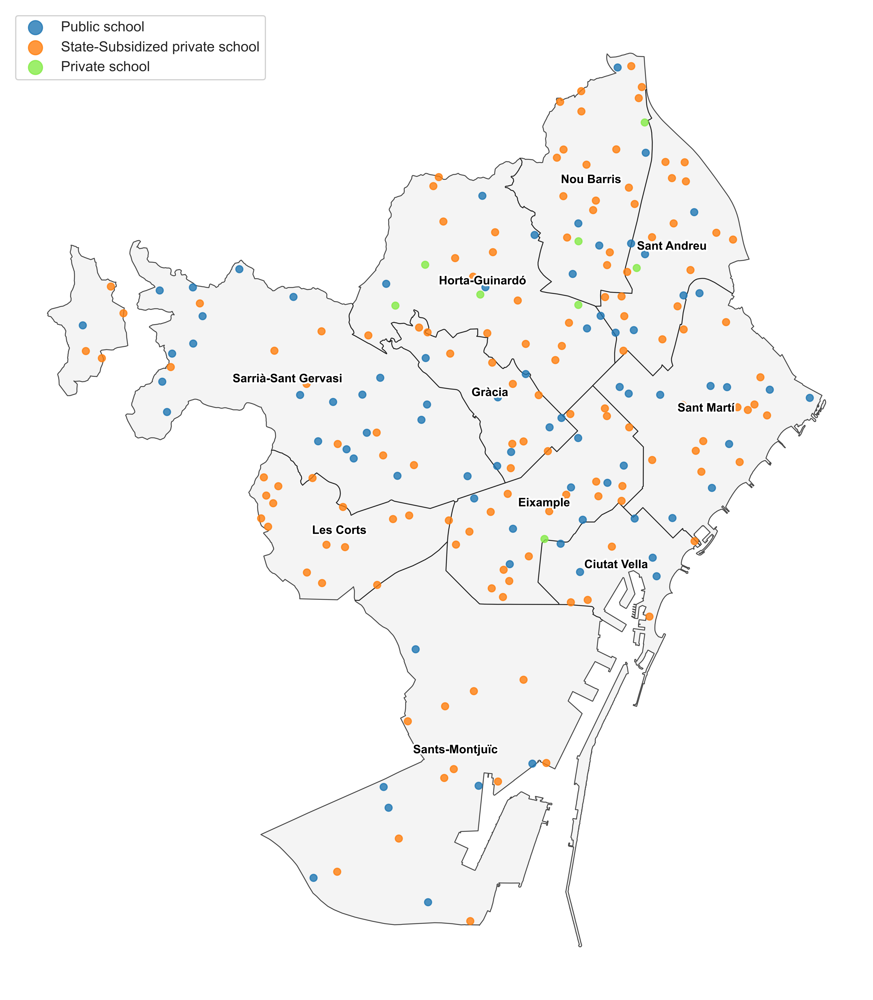

In [481]:
district_map = {
    "01": "Ciutat Vella", "02": "Eixample", "03": "Sants-Montjuïc",
    "04": "Les Corts", "05": "Sarrià-Sant Gervasi", "06": "Gràcia",
    "07": "Horta-Guinardó", "08": "Nou Barris", "09": "Sant Andreu", "10": "Sant Martí",
}
LABEL_MAPPING = {
    'Public': 'Public school',
    'Concertada': 'State-Subsidized private school',
    'Private': 'Private school'
}
districtsdf = pd.read_json("/Users/34633/avdata/truco-o-dato/data/BarcelonaCiutat_Districtes.json")
districtsdf['geometry'] = districtsdf['geometria_etrs89'].apply(wkt.loads)
districts = gpd.GeoDataFrame(districtsdf, geometry='geometry')
districts.set_crs(epsg=25831, inplace=True)
districts = districts.to_crs(epsg=4326)

districts.rename(columns={'nom_districte': 'District_Name'}, inplace=True)
districts.loc[:, 'District_Name'] = districts['District_Name'].str.strip()

colegiosbcn = pd.read_csv("/Users/34633/avdata/truco-o-dato/data_Anna/colegios bcn.csv", sep=";")
colegiosbcn = colegiosbcn.copy()

colegiosbcn["Municipi"] = colegiosbcn["Municipi"].astype(str).str.strip().str.upper()
colegiosbcn_barcelona = colegiosbcn[colegiosbcn["Municipi"] == "BARCELONA"].copy()

colegiosbcn_barcelona["Naturalesa"] = colegiosbcn_barcelona["Naturalesa"].astype(str).str.strip().str.upper()
colegiosbcn_barcelona["Centre amb concert (S/N)"] = colegiosbcn_barcelona["Centre amb concert (S/N)"].astype(str).str.strip().str.upper()
colegiosbcn_barcelona["Centres"] = pd.to_numeric(colegiosbcn_barcelona["Centres"], errors="coerce").fillna(0)

def classify_school(row):
    if row["Naturalesa"] == "PÚBLIC":
        return "Public"
    elif row["Naturalesa"] == "PRIVAT" and row["Centre amb concert (S/N)"] == "SI":
        return "Concertada"
    elif row["Naturalesa"] == "PRIVAT" and row["Centre amb concert (S/N)"] == "NO":
        return "Private"
    else:
        return None

colegiosbcn_barcelona.loc[:, "School_Type"] = colegiosbcn_barcelona.apply(classify_school, axis=1)
colegiosbcn_barcelona = colegiosbcn_barcelona.dropna(subset=["School_Type"])

colegiosbcn_barcelona.loc[:, 'District_Code'] = colegiosbcn_barcelona['Codi districte'].astype(str).str[-2:]
colegiosbcn_barcelona.loc[:, 'District_Name'] = colegiosbcn_barcelona['District_Code'].map(district_map)
schools_for_mapping = colegiosbcn_barcelona[['District_Name', 'School_Type', 'Centres']].copy()
schools_expanded = schools_for_mapping.loc[ schools_for_mapping.index.repeat(schools_for_mapping['Centres'].astype(int))].reset_index(drop=True)
schools_gdf = schools_expanded.merge( districts[['District_Name', 'geometry']], on='District_Name',how='left')
schools_gdf = gpd.GeoDataFrame(schools_gdf, geometry='geometry', crs=districts.crs)

def random_points_in_polygon(polygon, num_points):
    minx, miny, maxx, maxy = polygon.bounds
    points = []
    MIN_DISTANCE_SQUARED = 150**2 
    while len(points) < num_points:
        random_x = np.random.uniform(minx, maxx)
        random_y = np.random.uniform(miny, maxy)
        point = Point(random_x, random_y)
        if polygon.contains(point):
            is_too_close = False
            for existing_point in points:
                dist_sq = (point.x - existing_point.x)**2 + (point.y - existing_point.y)**2
                if dist_sq < MIN_DISTANCE_SQUARED:
                    is_too_close = True
                    break
            if not is_too_close:
                points.append(point)
    return points
    
new_geometries = []
districts_proj = districts.to_crs(epsg=25831)
for district_name, group in schools_gdf.groupby('District_Name'):
    district_polygon = districts_proj[districts_proj['District_Name'] == district_name].geometry.iloc[0]
    buffered_polygon = district_polygon.buffer(-2.0)
    num_schools = len(group)
    if buffered_polygon.is_empty or not buffered_polygon.is_valid:
        final_polygon = district_polygon
    else:
        final_polygon = buffered_polygon
    random_points_25831 = random_points_in_polygon(final_polygon, num_schools)
    random_points_4326 = gpd.GeoSeries(random_points_25831, crs=25831).to_crs(epsg=4326)
    new_geometries.extend(random_points_4326.tolist())
schools_gdf.loc[:, 'geometry'] = new_geometries
schools_gdf.set_crs(epsg=4326, inplace=True)

color_map = {'Public': '#1f77b4', 'Concertada': '#ff7f0e',   'Private': '#85eb47'        }
fig, ax = plt.subplots(figsize=(15, 15), dpi=500)
districts.plot(ax=ax,  edgecolor='black',  facecolor='#f0f0f0', cmap=None, alpha=0.7, linewidth=0.8)
for school_type, color in color_map.items():
    schools_gdf[schools_gdf['School_Type'] == school_type].plot(ax=ax, marker='o', color=color, markersize=35, alpha=0.8, label=LABEL_MAPPING[school_type] )
plt.legend( loc='upper left',  frameon=True, framealpha=0.9, fontsize=12, markerscale=2)
for idx, row in districts.iterrows():
    plt.annotate( text=row['District_Name'], xy=(row.geometry.centroid.x, row.geometry.centroid.y), horizontalalignment='center', fontsize=10, fontweight='bold', color='black', path_effects=[ pe.withStroke(linewidth=3, foreground='white')])
minx, miny, maxx, maxy = districts.total_bounds
pad_x = (maxx - minx) * 0.05
pad_y = (maxy - miny) * 0.05
ax.set_xlim(minx - pad_x, maxx + pad_x)
ax.set_ylim(miny - pad_y, maxy + pad_y)
plt.axis('off')
plt.show()

In [ ]:
MAPES PER FER LA PROPORCIO DE ESCOLES PER TIPUS A CADA BARRI. a partir de les escolese fer un merge amb el df de districtes. 

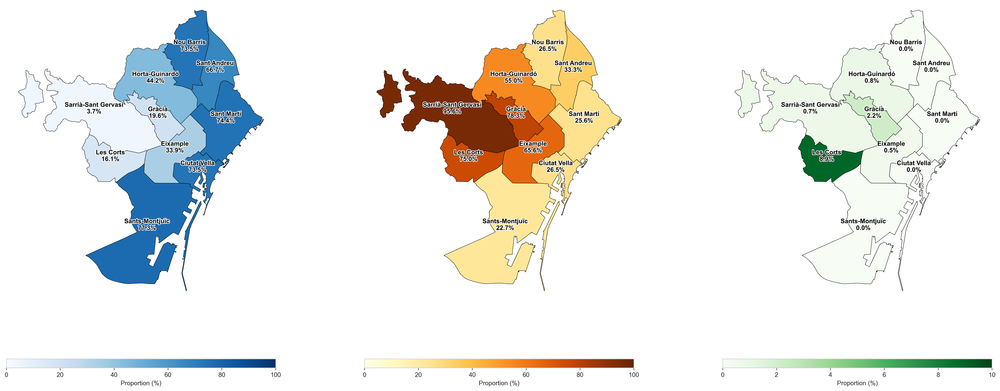

In [526]:
SCHOOL_TYPES = ['Public', 'Concertada', 'Private']
COLOR_MAPS = {'Public': 'Blues', 'Concertada': 'YlOrBr', 'Private': 'Greens'}
TITLES = {
    'Public':None,
    'Concertada': None,
    'Private': None
}

total_schools_per_district = schools_expanded.groupby('District_Name')['Centres'].sum().reset_index()
total_schools_per_district.rename(columns={'Centres': 'Total_Centres'}, inplace=True)
district_proportions = total_schools_per_district.copy()

for stype in SCHOOL_TYPES:
    stype_schools = schools_expanded[schools_expanded['School_Type'] == stype]
    stype_count = stype_schools.groupby('District_Name')['Centres'].sum().reset_index()
    stype_count.rename(columns={'Centres': f'{stype}_Centres'}, inplace=True)
    district_proportions = district_proportions.merge(stype_count, on='District_Name', how='left').fillna(0)
    district_proportions[f'Prop_{stype}'] = (district_proportions[f'{stype}_Centres'] / district_proportions['Total_Centres']) * 100
    district_proportions[f'Prop_{stype}'] = district_proportions[f'Prop_{stype}'].fillna(0)

merged_gdf = districts.merge(district_proportions, on='District_Name', how='left')
max_private_prop = merged_gdf['Prop_Private'].max()
vmax_private = np.ceil(max_private_prop / 5) * 5 if max_private_prop > 0 else 100

fig, axes = plt.subplots(1, 3, figsize=(25, 10), dpi=300)
axes = axes.flatten()

for i, stype in enumerate(SCHOOL_TYPES):
    ax = axes[i]
    prop_column = f'Prop_{stype}'
    cmap = COLOR_MAPS[stype]
    vmax_plot = vmax_private if stype == 'Private' else 100
    merged_gdf.plot(column=prop_column,ax=ax,legend=True,cmap=cmap,edgecolor='black', linewidth=0.5,vmin=0, vmax=vmax_plot, legend_kwds={'label': "Proportion (%)",'orientation': "horizontal",'shrink': 0.7,'aspect': 30},  missing_kwds={"color": "lightgrey", "edgecolor": "black", "hatch": "///", "label": "Sin datos"})
    for idx, row in merged_gdf.iterrows():
        percentage = row.get(prop_column, np.nan)
        if not np.isnan(percentage):
            ax.annotate(text=f"{row['District_Name']}\n{percentage:.1f}%",xy=(row.geometry.centroid.x, row.geometry.centroid.y), horizontalalignment='center', fontsize=10, fontweight='bold',  color='black',  path_effects=[pe.withStroke(linewidth=2, foreground='white')] )
    ax.axis('off')
minx, miny, maxx, maxy = merged_gdf.total_bounds
pad_x = (maxx - minx) * 0.02
pad_y = (maxy - miny) * 0.02

for ax in axes:
    ax.set_xlim(minx - pad_x, maxx + pad_x)
    ax.set_ylim(miny - pad_y, maxy + pad_y)
plt.tight_layout(pad=3.0)
plt.savefig('data_Anna/cmap_typeschool.png', dpi=500)
plt.show()